# Contents in this Jupyter Notebook

1. **Staring Setup**  
    - import import libraries
    - Load the data
    
2.  **Data Cleaning**
    - Drop those columns that are not useful for the data analysis
    - Removing the null values
    - Remove the duplicates
    - Check review list column
    - Check Restaurant name column
    - Making some new_columns for -
            - Rate_range column
            - Cost_range column

3. **Driving unique insights from the data using the Data Visualization**
     - Correlation
     - Top 5 restaurants names in different cities along with their total restaurants stores/shops present in the particular            specified city
     - Average Cost and Rating for each restaurant type
     - Top 20 cusines
     - Number of votes vs Aggregate Rating
     - Distribution of aggregate_rating
     - Number of votes vs aggregate_rating
     - Probablity distribution of average_cost
     - Relation of ratings and high cost restaurants
     - Relation of ratings and low cost restaurants
     - Distribution of the Price_range and cost Range
     - Excellent rated restaurants have high aggregate rate compare to others
     - Top international Cuisines served in India cities
     - Scatter plot for aggregate rating over average cost
     - Restaurant Distribution over locality
     - Aggregate Rating per Locality
     - Cusine trend per Locality
     - Service types popular
     - Top 10 Count of restaurants with respect to cities  present in different localities 
     - restaurants have online order booking & book table booking
     - How the online order booking affects the restaurant agregate rating
     - How the table order booking affects the restaurant agregate rating
     - Best restaurants providing online_order
     - Best restaurants providing table_order
     - Rating text popular in restaurants of India
     - City wise different color used for the rating purpose
     - Rating Color popular in restaurants of India
     - Average Rating according to restaurant service
     - relation between cost and neighbouhood
     - relation between votes and neighbouhood
     - Best rated, most voted restaurants, irrespective of cost
     - Best restaurants in Agra 
     - Where can one find the best restaurants in Agra
     - Average cost at this overall best restaurants
     - Top 10 restaurant chain in Agra and different cities
     - Heatmap for density of restaurants from different cities
     
4.  ** HeatMap ** 
 -  Heatmap for density of restaurants in different cities
 

5. **Predictions** <br>
 - Label encoding online_order and book_table for Regression analysis
 - Multi Label Binarizing (1- hot encoding) cuisines_list feature for Regression analysis

 - * **Aggregate_rating** prediction by Regression Analysis*
     - Train Test split
     - Linear Regression
     - Decision Tree Regression
     - Random Forest Regression


 - *Number of **votes** prediction by Regression Analysis*
     - Train Test split
     - Linear Regression
     - Decision Tree Regression
     - Random Forest Regression

In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


# Import libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import seaborn as sns
plt.style.use('fivethirtyeight')
plt.xkcd()
%matplotlib inline
pd.set_option('display.max_columns', None)

from folium.plugins import HeatMap
import folium

from sklearn.linear_model import LogisticRegression 
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import classification_report 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score,accuracy_score,f1_score,recall_score
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import MultiLabelBinarizer

In [3]:
df = pd.read_excel("data_res.xlsx")

In [4]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),No,No,No,No,3,3.9,Yellow,Good,140
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),No,No,No,No,2,3.5,Yellow,Good,71
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,94
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),No,No,No,No,2,4.0,Green,Very Good,87
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),No,No,No,No,3,4.2,Green,Very Good,177


In [5]:
# Statistical and normal information

In [6]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,8.652000e+03,8652.0,8652.000000,8652.000000,8652.000000,8652.000000,8652.000000,8652.000000
mean,8.657085e+06,1.0,72.856786,26.420652,623.370319,1.721683,2.523324,137.212552
std,8.959437e+06,0.0,18.017536,6.976576,595.676124,0.852544,1.510986,428.039513
min,5.300000e+01,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,3.007402e+05,1.0,77.098797,28.491425,300.000000,1.000000,2.100000,4.000000
50%,2.200006e+06,1.0,77.203468,28.569869,450.000000,2.000000,3.100000,24.000000
75%,1.836120e+07,1.0,77.285356,28.637857,700.000000,2.000000,3.600000,100.000000
max,1.850065e+07,1.0,91.806493,35.000000,8000.000000,4.000000,4.900000,10934.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8652 entries, 0 to 8651
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         8652 non-null   int64  
 1   Restaurant Name       8652 non-null   object 
 2   Country Code          8652 non-null   int64  
 3   City                  8652 non-null   object 
 4   Address               8652 non-null   object 
 5   Locality              8652 non-null   object 
 6   Locality Verbose      8652 non-null   object 
 7   Longitude             8652 non-null   float64
 8   Latitude              8652 non-null   float64
 9   Cuisines              8652 non-null   object 
 10  Average Cost for two  8652 non-null   int64  
 11  Currency              8652 non-null   object 
 12  Has Table booking     8652 non-null   object 
 13  Has Online delivery   8652 non-null   object 
 14  Is delivering now     8652 non-null   object 
 15  Switch to order menu 

# Starting the data cleaning

In [8]:
# We will make a copy of the data because if any changes occurs, it won't affect the original dataset

In [9]:
data = df.copy()

In [10]:
# Renaming the column names

In [11]:
data.rename(columns = {"Average Cost for two":"average_cost","Has Table booking":"table_booking","Has Online delivery":"Online_Delivery","Aggregate rating":"aggregating_rating","Restaurant ID":"Restaurant_ID","Restaurant Name":"Restaurant_Name","Country Code":"Country_Code","Locality Verbose":"Locality_Verbose","Is delivering now":"Is_delivering_now","Switch to order menu":"Switch_to_order_menu","Price range":"Price_range","Aggregate rating":"Aggregate_rating","Rating color":"Rating_color","Rating text":"Rating_text"},inplace = True)

In [12]:
# Checking the changed columns names
data.columns

Index(['Restaurant_ID', 'Restaurant_Name', 'Country_Code', 'City', 'Address',
       'Locality', 'Locality_Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'average_cost', 'Currency', 'table_booking', 'Online_Delivery',
       'Is_delivering_now', 'Switch_to_order_menu', 'Price_range',
       'Aggregate_rating', 'Rating_color', 'Rating_text', 'Votes'],
      dtype='object')

In [13]:
# checking the sum of  the Null values in each columns
data.isna().sum()

Restaurant_ID           0
Restaurant_Name         0
Country_Code            0
City                    0
Address                 0
Locality                0
Locality_Verbose        0
Longitude               0
Latitude                0
Cuisines                0
average_cost            0
Currency                0
table_booking           0
Online_Delivery         0
Is_delivering_now       0
Switch_to_order_menu    0
Price_range             0
Aggregate_rating        0
Rating_color            0
Rating_text             0
Votes                   0
dtype: int64

In [14]:
# dropping the na rows from each column

data.dropna()

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,average_cost,Currency,table_booking,Online_Delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),No,No,No,No,3,3.9,Yellow,Good,140
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),No,No,No,No,2,3.5,Yellow,Good,71
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,94
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),No,No,No,No,2,4.0,Green,Very Good,87
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),No,No,No,No,3,4.2,Green,Very Good,177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8647,2800100,D Cabana,1,Vizag,"Beach Road, Near Bus Stop, Sagar Nagar, Visakh...",Sagar Nagar,"Sagar Nagar, Vizag",83.361377,17.764287,"Continental, Seafood, Chinese, North Indian, B...",600,Indian Rupees(Rs.),No,No,No,No,2,3.6,Yellow,Good,193
8648,2800418,Kaloreez,1,Vizag,"Plot 95, Opposite St. Lukes Nursing School, Da...",Siripuram,"Siripuram, Vizag",0.000000,0.000000,"Cafe, North Indian, Chinese",400,Indian Rupees(Rs.),No,No,No,No,2,3.7,Yellow,Good,85
8649,2800881,Plot 17,1,Vizag,"Plot 17, Gangapur Layout, Siripuram, Vizag",Siripuram,"Siripuram, Vizag",83.315281,17.719539,"Burger, Pizza, Biryani",600,Indian Rupees(Rs.),No,No,No,No,2,4.3,Green,Very Good,172
8650,2800042,Vista - The Park,1,Vizag,"The Park, Beach Road, Pedda Waltair, Lawsons B...","The Park, Lawsons Bay","The Park, Lawsons Bay, Vizag",83.336840,17.721182,"American, North Indian, Thai, Continental",1500,Indian Rupees(Rs.),No,No,No,No,4,3.8,Yellow,Good,74


In [15]:
# checking the sum of all the duplicate values
data.duplicated().sum()

0

In [16]:
# drop the duplicates rows

data.drop_duplicates(inplace =True)

In [17]:
((data.isna().sum()/data.shape[0])*100).round(2)

Restaurant_ID           0.0
Restaurant_Name         0.0
Country_Code            0.0
City                    0.0
Address                 0.0
Locality                0.0
Locality_Verbose        0.0
Longitude               0.0
Latitude                0.0
Cuisines                0.0
average_cost            0.0
Currency                0.0
table_booking           0.0
Online_Delivery         0.0
Is_delivering_now       0.0
Switch_to_order_menu    0.0
Price_range             0.0
Aggregate_rating        0.0
Rating_color            0.0
Rating_text             0.0
Votes                   0.0
dtype: float64

In [18]:
data.shape[0]

8652

In [19]:
# Check for the unique values in the aggregate_rating column
data.Aggregate_rating.unique()

array([3.9, 3.5, 3.6, 4. , 4.2, 4.3, 3.8, 4.1, 3.4, 4.9, 3.7, 4.4, 4.5,
       4.6, 3.3, 3.2, 3.1, 4.7, 4.8, 2.9, 2.8, 3. , 0. , 2.1, 2.7, 2.4,
       2.6, 2.5, 1.8, 2.2, 2. , 2.3, 1.9])

In [20]:
# Drop null values for Aggregate_rating and average_cost 

data.dropna(subset=['Aggregate_rating', 'average_cost'],inplace=True)

In [21]:
## Coverting the Yes/ No to Boolean True/False because it will make easier to analyze the columns


data.table_booking.replace(('Yes','No'),(True,False),inplace =True)
data.Online_Delivery.replace(('Yes','No'),(True,False),inplace =True)
data.Is_delivering_now.replace(('Yes','No'),(True,False),inplace =True)
data.Switch_to_order_menu.replace(('Yes','No'),(True,False),inplace =True)

In [22]:
data

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,average_cost,Currency,table_booking,Online_Delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),False,False,False,False,3,3.9,Yellow,Good,140
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),False,False,False,False,2,3.5,Yellow,Good,71
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,94
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),False,False,False,False,2,4.0,Green,Very Good,87
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),False,False,False,False,3,4.2,Green,Very Good,177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8647,2800100,D Cabana,1,Vizag,"Beach Road, Near Bus Stop, Sagar Nagar, Visakh...",Sagar Nagar,"Sagar Nagar, Vizag",83.361377,17.764287,"Continental, Seafood, Chinese, North Indian, B...",600,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,193
8648,2800418,Kaloreez,1,Vizag,"Plot 95, Opposite St. Lukes Nursing School, Da...",Siripuram,"Siripuram, Vizag",0.000000,0.000000,"Cafe, North Indian, Chinese",400,Indian Rupees(Rs.),False,False,False,False,2,3.7,Yellow,Good,85
8649,2800881,Plot 17,1,Vizag,"Plot 17, Gangapur Layout, Siripuram, Vizag",Siripuram,"Siripuram, Vizag",83.315281,17.719539,"Burger, Pizza, Biryani",600,Indian Rupees(Rs.),False,False,False,False,2,4.3,Green,Very Good,172
8650,2800042,Vista - The Park,1,Vizag,"The Park, Beach Road, Pedda Waltair, Lawsons B...","The Park, Lawsons Bay","The Park, Lawsons Bay, Vizag",83.336840,17.721182,"American, North Indian, Thai, Continental",1500,Indian Rupees(Rs.),False,False,False,False,4,3.8,Yellow,Good,74


In [23]:
# Unqiue values for the average_cost values

data.average_cost.unique()

array([ 850,  700,  500,  400, 1000, 2000, 2500,  800, 3600,    0,  550,
       1100, 1500,  900, 1800,  300, 1400,  350,  450,  600,  950, 1200,
        200,  100,  150,  650, 1300, 2400,  250, 1600, 2200,  750, 1700,
       1250, 1900, 2700, 3500, 5000, 2300, 1750, 3200, 3000, 2100, 1850,
       4500, 4000, 3300,  120, 1350, 1650, 1950, 1050,  290,   50, 1450,
       2800,  260, 3650, 4800, 1550,  720, 6500, 7000, 1150, 2900, 2600,
       4700, 3700, 3800, 4100, 4300, 2650, 6000, 5100, 5500, 4400, 4200,
       8000, 2350], dtype=int64)

### Important

###### 1. Lets make a new column which  will containing variety of cost level 

 -  **Very_cheap**: 0-1000
 -  **Cheap** : 1000-2000
 -  **Moderate** : 2000-4000
 -  **Expensive** : 4000 - 6000
 -  **Very** :  6000-8000
 
###### 2. Repeat the same process for the Aggregate_rating

# Create a cost_range column

In [24]:
l =  [0,1000,2000,4000,6000,8000]
labels = ["Very_cheap","Cheap","Moderate","Expensive","Very"]
data['cost_range'] = pd.cut(data.average_cost,bins = l,labels= labels)

In [25]:
data.loc[:,['cost_range','average_cost']]

,cost_range,average_cost
0,Very_cheap,850
1,Very_cheap,700
2,Very_cheap,500
3,Very_cheap,400
4,Very_cheap,1000
...,...,...
8647,Very_cheap,600
8648,Very_cheap,400
8649,Very_cheap,600
8650,Cheap,1500


* Lets create the **rate_range** column  

In [26]:
l = [0,2,3,4,5]
labels = ['low','moderate','high','exceptional']
data['rate_range'] = pd.cut(data.Aggregate_rating, bins=l,labels=labels)

In [27]:
data[['Aggregate_rating','rate_range']]

,Aggregate_rating,rate_range
0,3.9,high
1,3.5,high
2,3.6,high
3,4.0,high
4,4.2,exceptional
...,...,...
8647,3.6,high
8648,3.7,high
8649,4.3,exceptional
8650,3.8,high


# We will convert the comma seperated column element to list

In [28]:
best_cafe= data['Restaurant_Name'].apply(lambda x: str(x).strip().split(','))
data['rest_type_list']= pd.DataFrame(best_cafe)


cuisines_list= data['Cuisines'].apply(lambda x: str(' '+str(x)).split(','))
data['new_cuisines_list']= pd.DataFrame(cuisines_list)

data

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,average_cost,Currency,table_booking,Online_Delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes,cost_range,rate_range,rest_type_list,new_cuisines_list
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),False,False,False,False,3,3.9,Yellow,Good,140,Very_cheap,high,[Jahanpanah],"[ North Indian, Mughlai]"
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),False,False,False,False,2,3.5,Yellow,Good,71,Very_cheap,high,[Rangrezz Restaurant],"[ North Indian, Mughlai]"
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,94,Very_cheap,high,[Time2Eat - Mama Chicken],[ North Indian]
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),False,False,False,False,2,4.0,Green,Very Good,87,Very_cheap,high,[Chokho Jeeman Marwari Jain Bhojanalya],[ Rajasthani]
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),False,False,False,False,3,4.2,Green,Very Good,177,Very_cheap,exceptional,[Pinch Of Spice],"[ North Indian, Chinese, Mughlai]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8647,2800100,D Cabana,1,Vizag,"Beach Road, Near Bus Stop, Sagar Nagar, Visakh...",Sagar Nagar,"Sagar Nagar, Vizag",83.361377,17.764287,"Continental, Seafood, Chinese, North Indian, B...",600,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,193,Very_cheap,high,[D Cabana],"[ Continental, Seafood, Chinese, North Indi..."
8648,2800418,Kaloreez,1,Vizag,"Plot 95, Opposite St. Lukes Nursing School, Da...",Siripuram,"Siripuram, Vizag",0.000000,0.000000,"Cafe, North Indian, Chinese",400,Indian Rupees(Rs.),False,False,False,False,2,3.7,Yellow,Good,85,Very_cheap,high,[Kaloreez],"[ Cafe, North Indian, Chinese]"
8649,2800881,Plot 17,1,Vizag,"Plot 17, Gangapur Layout, Siripuram, Vizag",Siripuram,"Siripuram, Vizag",83.315281,17.719539,"Burger, Pizza, Biryani",600,Indian Rupees(Rs.),False,False,False,False,2,4.3,Green,Very Good,172,Very_cheap,exceptional,[Plot 17],"[ Burger, Pizza, Biryani]"
8650,2800042,Vista - The Park,1,Vizag,"The Park, Beach Road, Pedda Waltair, Lawsons B...","The Park, Lawsons Bay","The Park, Lawsons Bay, Vizag",83.336840,17.721182,"American, North Indian, Thai, Continental",1500,Indian Rupees(Rs.),False,False,False,False,4,3.8,Yellow,Good,74,Cheap,high,[Vista - The Park],"[ American, North Indian, Thai, Continental]"


#  Lets do the data visualization part for getting better insights using different graph 

In [29]:
data.columns

Index(['Restaurant_ID', 'Restaurant_Name', 'Country_Code', 'City', 'Address',
       'Locality', 'Locality_Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'average_cost', 'Currency', 'table_booking', 'Online_Delivery',
       'Is_delivering_now', 'Switch_to_order_menu', 'Price_range',
       'Aggregate_rating', 'Rating_color', 'Rating_text', 'Votes',
       'cost_range', 'rate_range', 'rest_type_list', 'new_cuisines_list'],
      dtype='object')

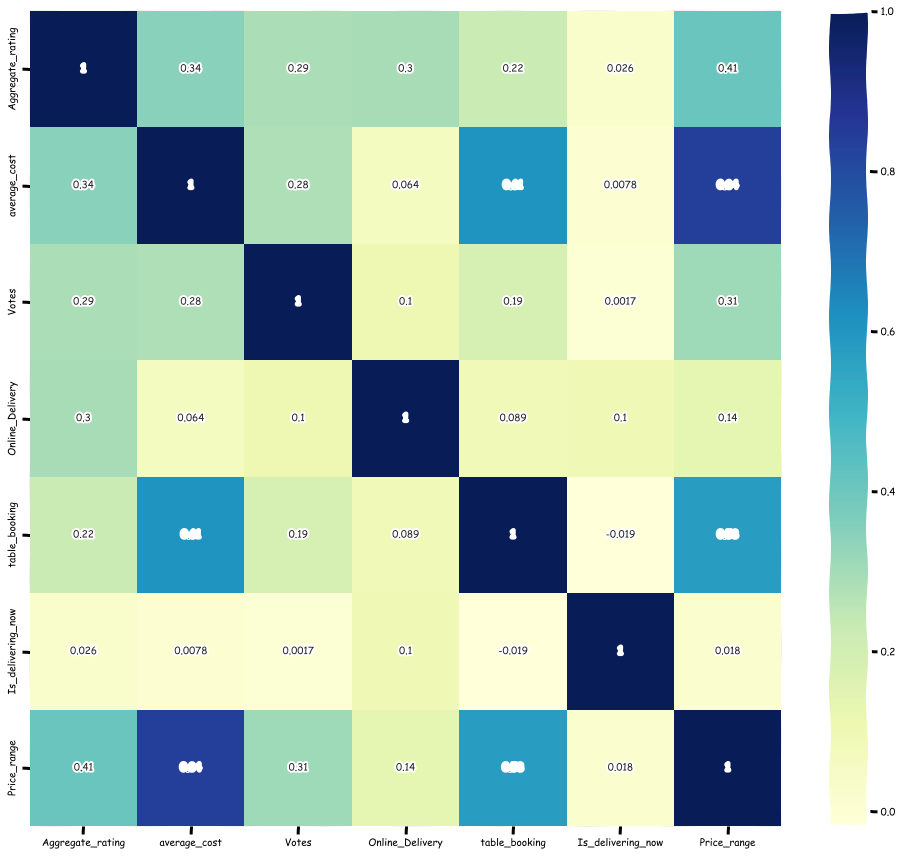

In [30]:
plt.figure(figsize = (15,15))
plt.yticks(rotation = 45)
sns.heatmap(data[['Aggregate_rating','average_cost','Votes','Online_Delivery',
                  'table_booking','Cuisines',
                  'rate_range','cost_range','Is_delivering_now'
                 ,'Price_range']].corr(),cmap="YlGnBu",  annot=True);
plt.show()

**average_cost** and **Price_range**  has relatively higher co-relation ,compared to **Aggregate_rating** and **Price_range**


**table_booking** and **average_cost** has relatively same co-relation as **table_booking** and **Price_range** 


**Votes**,**Average_cost** ,**Price_range** and **Average_rating** has almost no co-relation with **Is_delivering_now**


**Is_delivering_now** is having negative co-relation with **table_booking**

# Top restaurants in different cities

In [31]:
data.City

0        Agra
1        Agra
2        Agra
3        Agra
4        Agra
        ...  
8647    Vizag
8648    Vizag
8649    Vizag
8650    Vizag
8651    Vizag
Name: City, Length: 8652, dtype: object

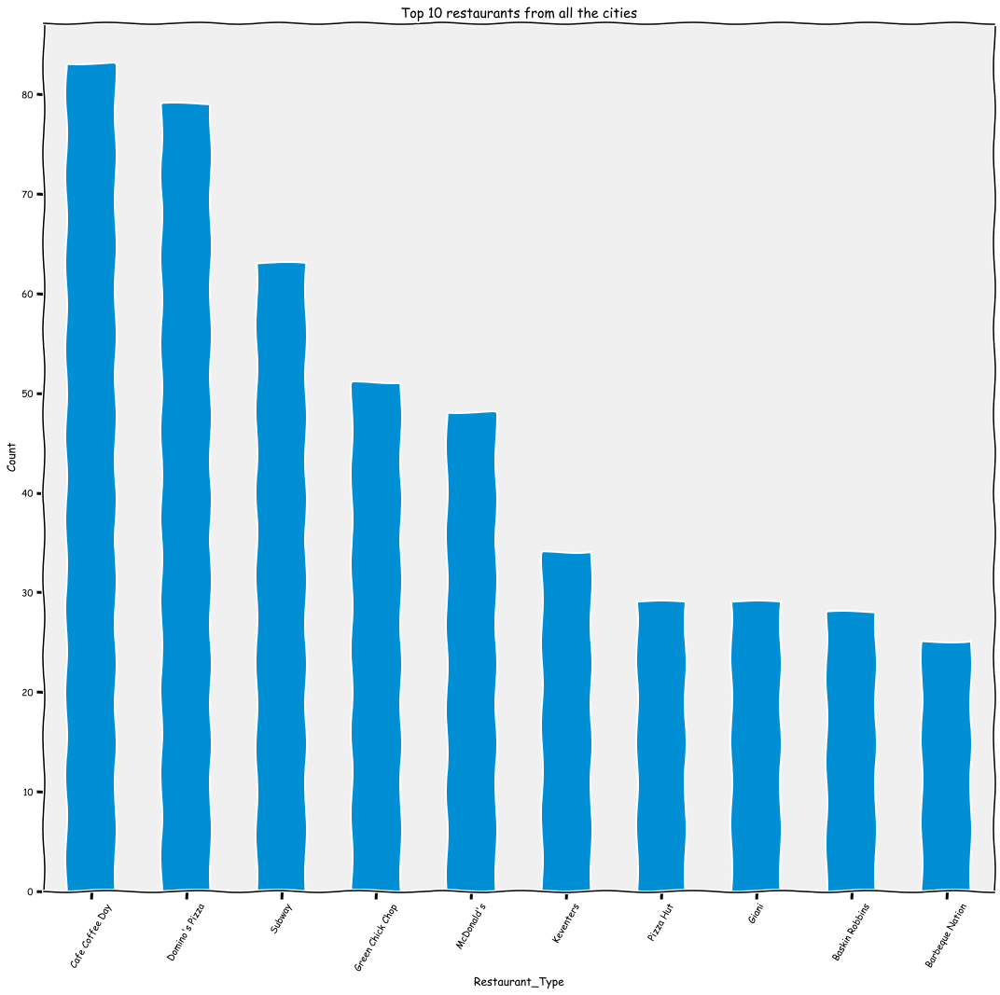

In [32]:
# plotting bar plots
plt.figure(figsize = (15,15))
data['Restaurant_Name'].value_counts()[:10].plot(kind = 'bar')
plt.title("Top 10 restaurants from all the cities")
plt.xlabel("Restaurant_Type")
plt.ylabel("Count");
plt.tight_layout();
plt.xticks(rotation = 60);
plt.show()

**Cafe Coffee Day** is the most famous restaurant throughout all the cities which is followed by **Domino's Pizza** and then **Subway**


**Cafe Coffee Day** have more than 80 stores/shops present and then followed by **Domino's Pizza** 

In [33]:
# Different restaurant names

In [34]:
a= data['Restaurant_Name'].value_counts()[:10].index
a

Index(['Cafe Coffee Day', 'Domino's Pizza', 'Subway', 'Green Chick Chop',
       'McDonald's', 'Keventers', 'Pizza Hut', 'Giani', 'Baskin Robbins',
       'Barbeque Nation'],
      dtype='object')

#### Top 5 restaurants names in different cities along with their total restaurants stores/shops present in the particular specified city

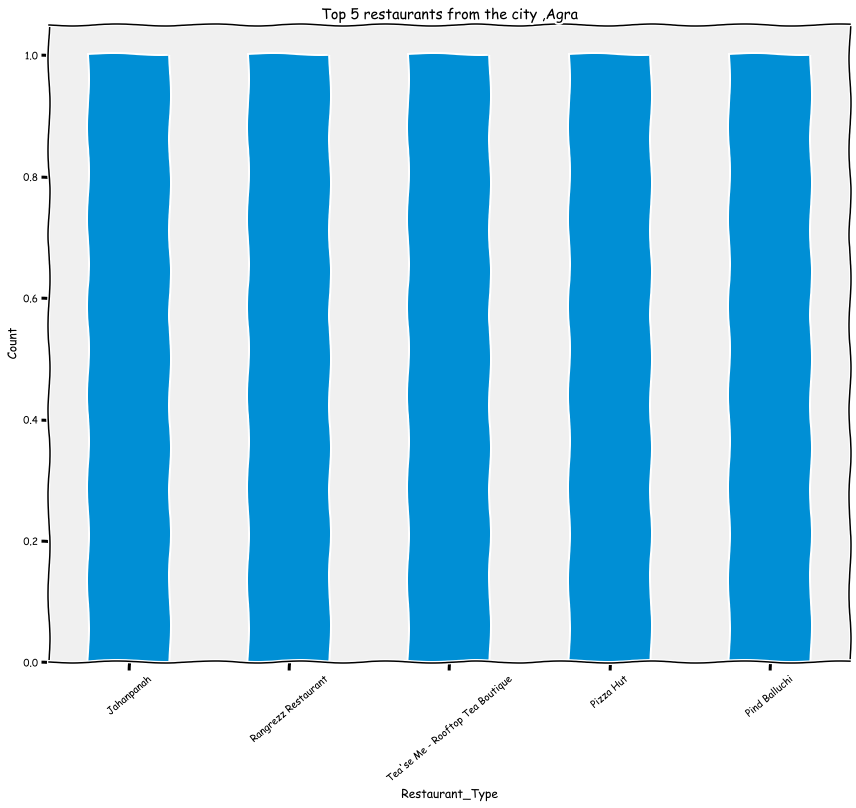

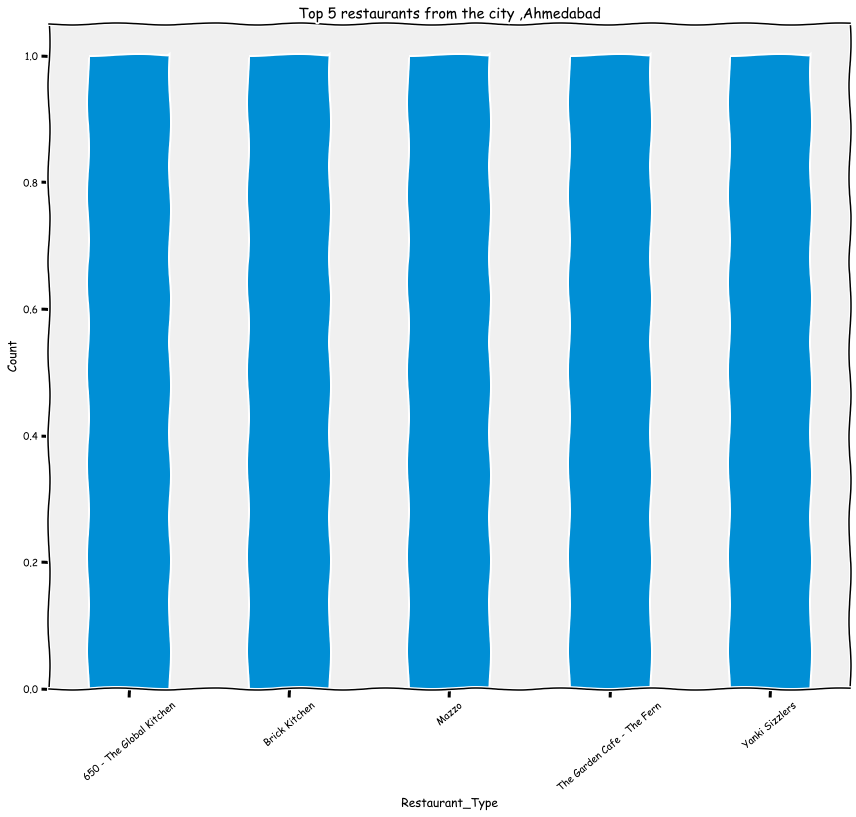

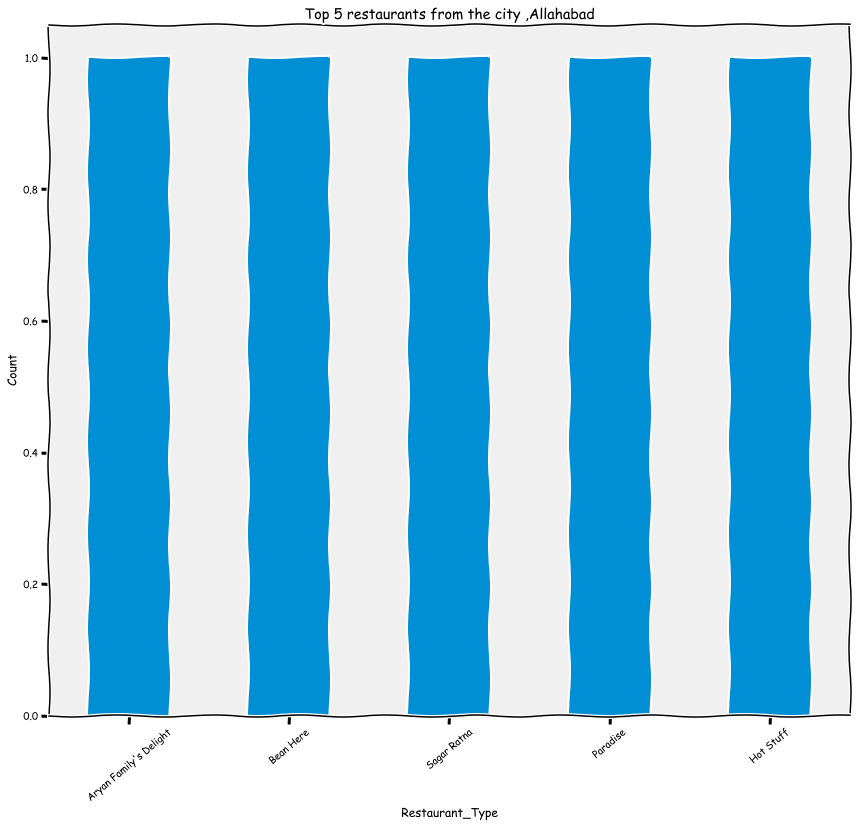

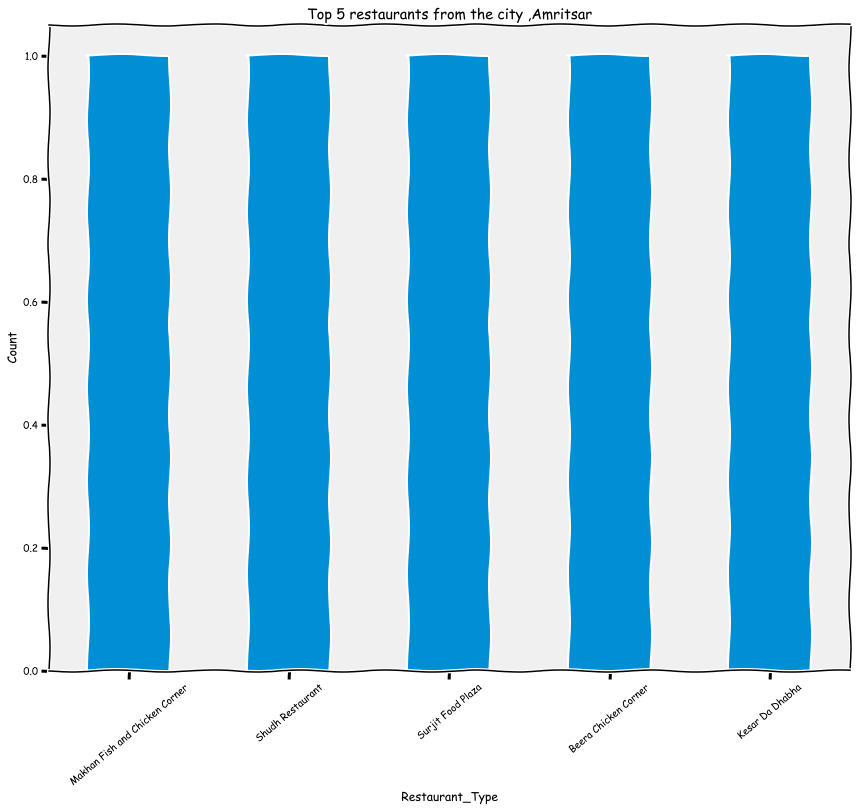

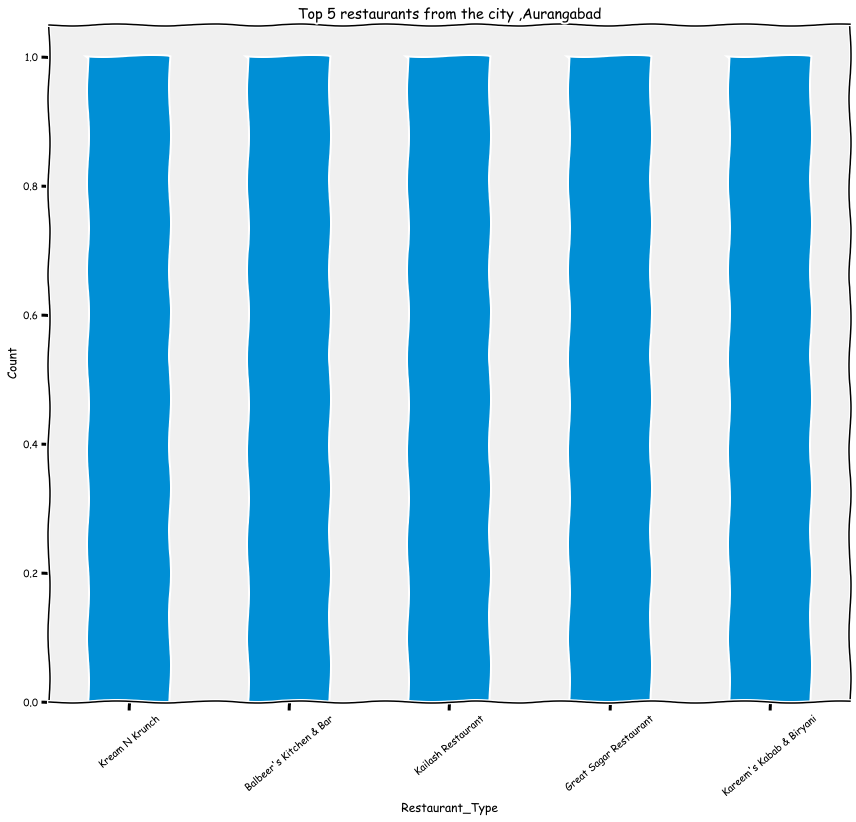

...

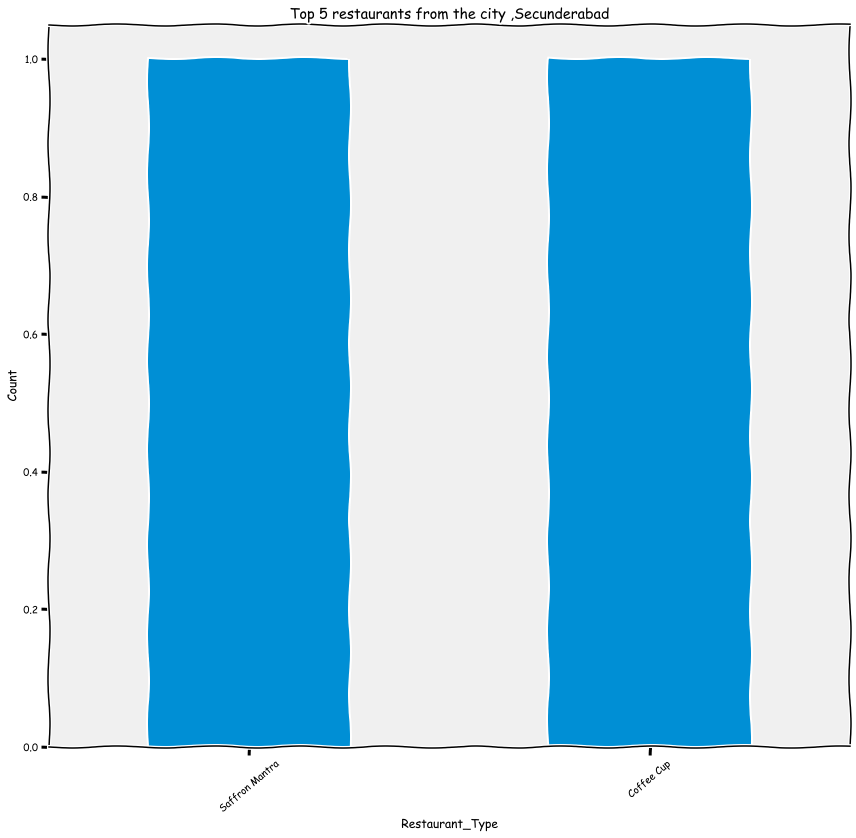

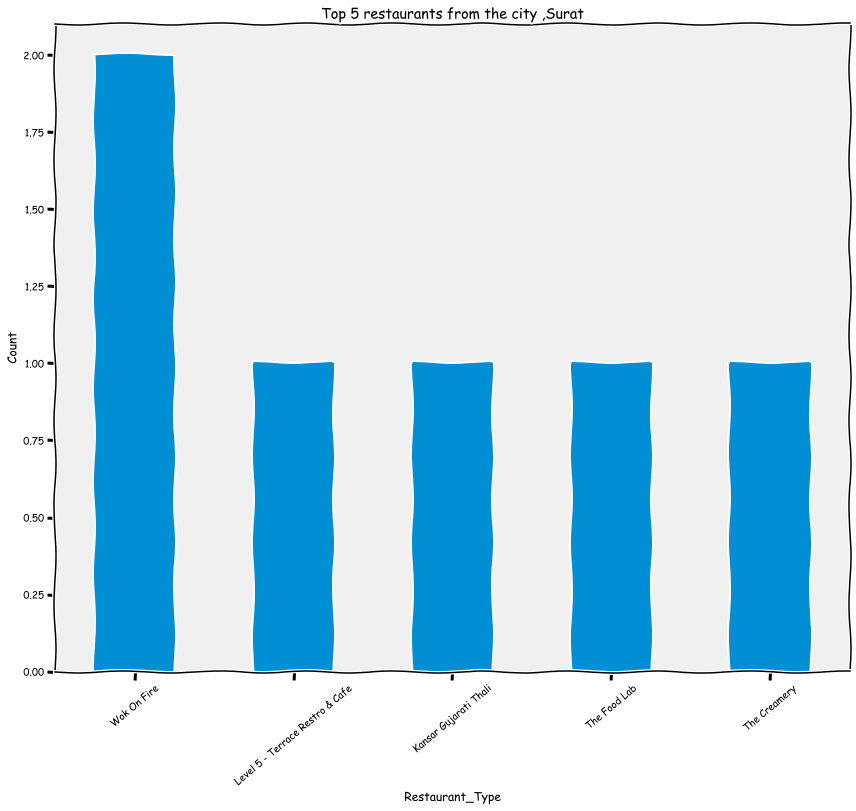

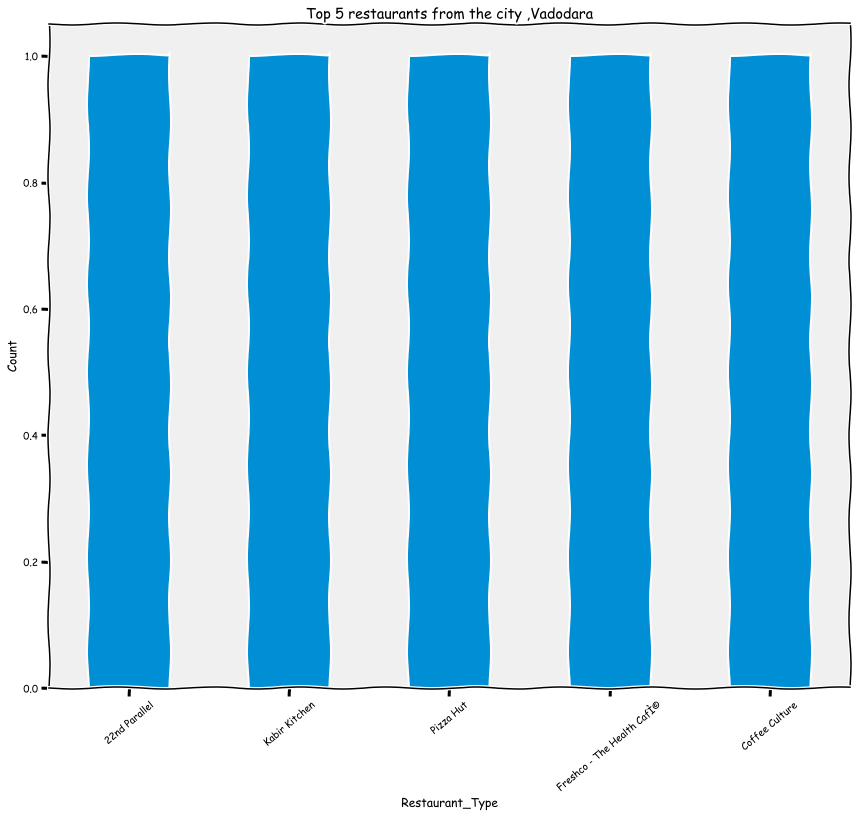

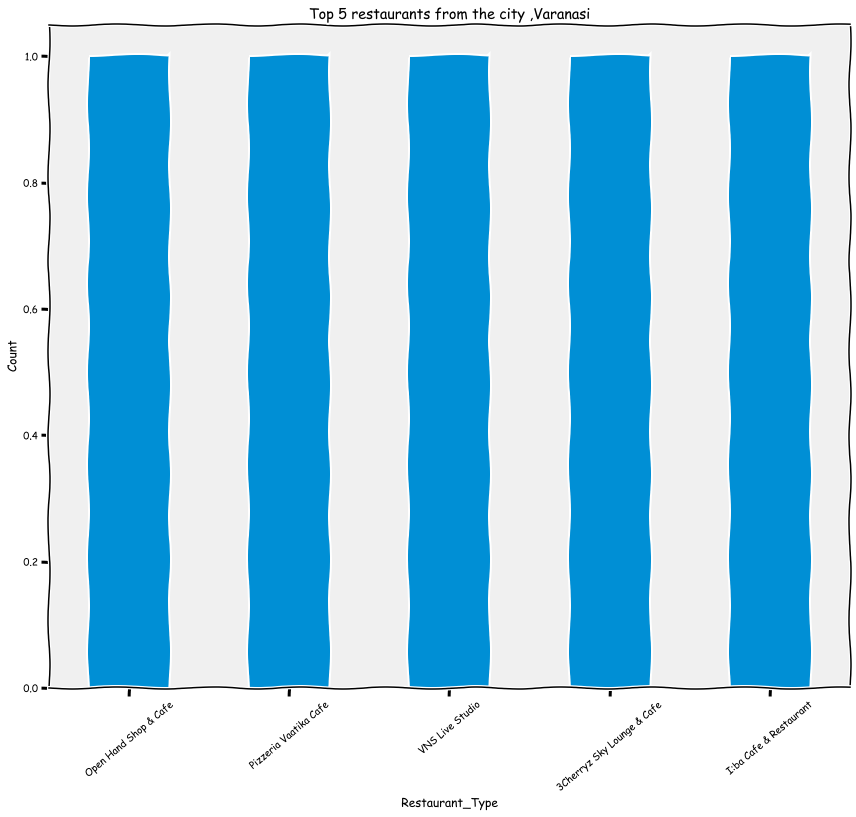

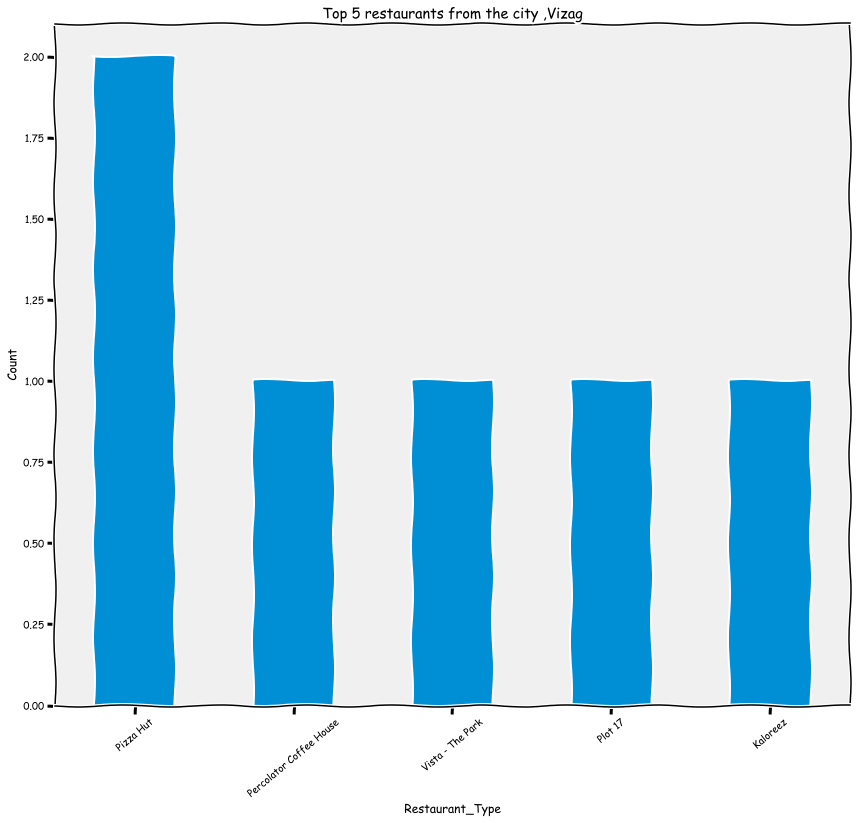

In [35]:
for i in data['City'].unique():
    plt.figure(figsize = (12,12))
    data[data["City"]==i]['Restaurant_Name'].value_counts()[0:5].plot(kind = 'bar')
    plt.title(f"Top 5 restaurants from the city ,{i}")
    plt.xlabel("Restaurant_Type")
    plt.ylabel("Count");
    plt.tight_layout();
    plt.xticks(rotation = 40);
    plt.show()

### Average cost and rating given to restaurant according to Raing Text

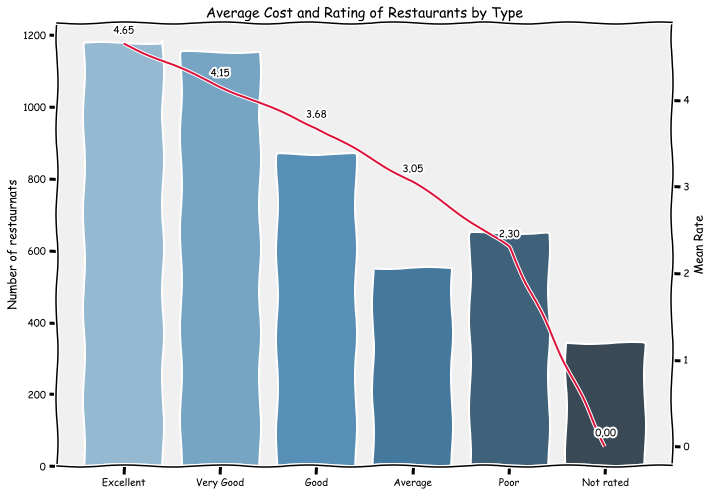

In [36]:
rest_params = data.groupby(by='Rating_text', as_index=False).mean().sort_values(by='Aggregate_rating',ascending=False)
fig, ax = plt.subplots(figsize=(10, 7))
sns.barplot(x='Rating_text', y='average_cost', data=rest_params, ax=ax, palette='Blues_d')
ax2 = ax.twinx()
sns.lineplot(x='Rating_text', y='Aggregate_rating', data=rest_params, ax=ax2, color='crimson', sort=False)
ax.tick_params(axis='x', labelrotation=0)

ax.xaxis.set_label_text("")

xs = np.arange(0,10,1)
ys = rest_params['Aggregate_rating']

for x,y in zip(xs,ys):
    label = "{:.2f}".format(y)
    plt.annotate(label, # this is the text
                 (x,y), # this is the point to label
                 textcoords="offset points", # how to position the text
                 xytext=(0,10), # distance from text to points (x,y)
                 ha='center', # horizontal alignment can be left, right or center
                 color='black')

ax.set_title('Average Cost and Rating of Restaurants by Type', size=14)
ax.set_ylabel('Number of restaurnats')
ax2.set_ylabel('Mean Rate')
plt.tight_layout()

###### Excellent rated restaurants have high aggregate rate compare to others

In [37]:
###  Top cuisines 

In [38]:
data.columns

Index(['Restaurant_ID', 'Restaurant_Name', 'Country_Code', 'City', 'Address',
       'Locality', 'Locality_Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'average_cost', 'Currency', 'table_booking', 'Online_Delivery',
       'Is_delivering_now', 'Switch_to_order_menu', 'Price_range',
       'Aggregate_rating', 'Rating_color', 'Rating_text', 'Votes',
       'cost_range', 'rate_range', 'rest_type_list', 'new_cuisines_list'],
      dtype='object')

In [39]:
def count_element_in_list(x):
    'extract the data and count it from comma separted string values in column x returns a pd.Series ready to plot'
    return pd.Series([e.strip() for i in data[data[x].notnull()][x] for e in i.split(',')])

In [40]:
count_element_in_list('Cuisines').value_counts()

North Indian      3946
Chinese           2690
Fast Food         1963
Mughlai            992
Bakery             726
                  ... 
Cuisine Varies       1
Deli                 1
Sri Lankan           1
BBQ                  1
Cajun                1
Length: 90, dtype: int64

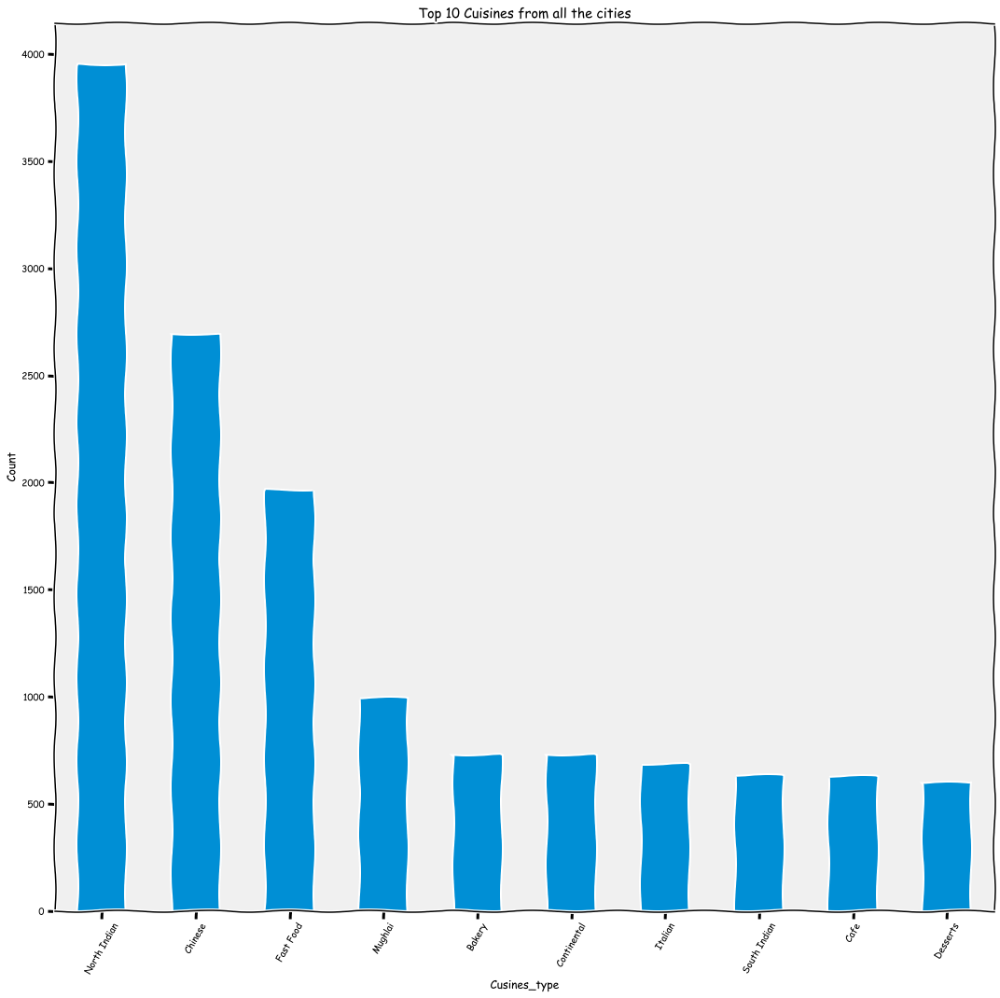

In [41]:
# plotting bar plots
plt.figure(figsize = (15,15))
count_element_in_list('Cuisines').value_counts()[:10].plot(kind = 'bar')
plt.title("Top 10 Cuisines from all the cities")
plt.xlabel("Cusines_type")
plt.ylabel("Count");
plt.tight_layout();
plt.xticks(rotation = 60);
plt.show()

We can see the maximum number of cuisines serving ood is the **North Indian** follwed by **Chinese** and then **Fast Food**

### Top international Cuisines served in India cities

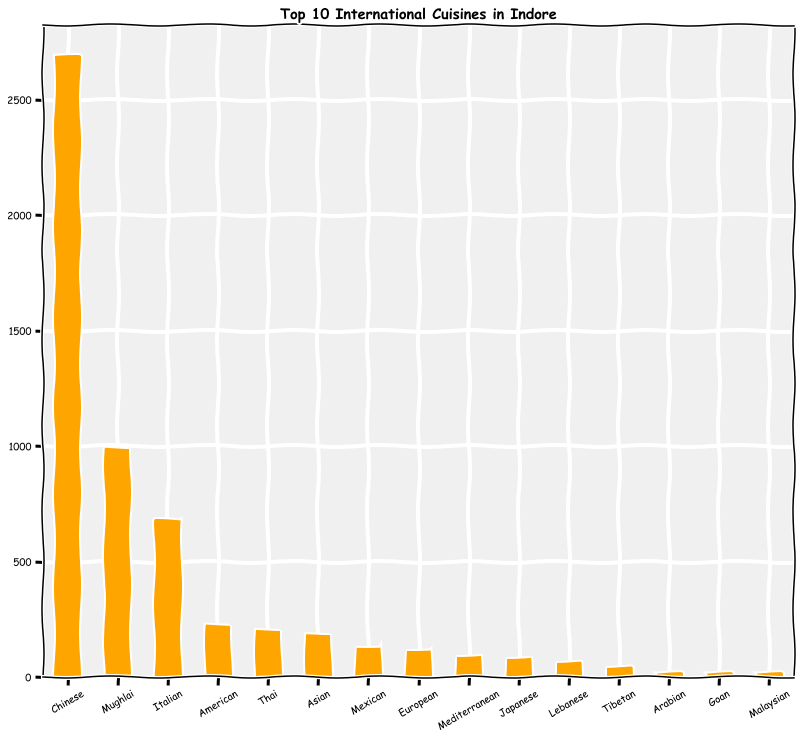

In [42]:
plt.figure(figsize = (12,12))
international_cusine = []
for i in count_element_in_list('Cuisines'):
    if 'Mithai' not in i.split() and 'Indian' not in i.split() and 'Paan' not in i.split():
        if i[-2:] == 'an' or i[-2:] == 'se' or i[-2:] == 'ai':
            international_cusine.append(i)
pd.Series(international_cusine).value_counts()[:15].plot(kind = 'bar',color= 'orange', grid=True)
plt.title('Top 10 International Cuisines in Indore',weight='bold');
plt.xticks(rotation=30)
del international_cusine

Top international_Restaurant is the **Chinese** food and then after **Mughlai** and then after **Italian**

So from the above map ,we can see that the food market in India is highly mixed up or highly diversified with different food culture from all over the world

In [43]:
data.head()

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,average_cost,Currency,table_booking,Online_Delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes,cost_range,rate_range,rest_type_list,new_cuisines_list
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),False,False,False,False,3,3.9,Yellow,Good,140,Very_cheap,high,[Jahanpanah],"[ North Indian, Mughlai]"
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),False,False,False,False,2,3.5,Yellow,Good,71,Very_cheap,high,[Rangrezz Restaurant],"[ North Indian, Mughlai]"
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,94,Very_cheap,high,[Time2Eat - Mama Chicken],[ North Indian]
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),False,False,False,False,2,4.0,Green,Very Good,87,Very_cheap,high,[Chokho Jeeman Marwari Jain Bhojanalya],[ Rajasthani]
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),False,False,False,False,3,4.2,Green,Very Good,177,Very_cheap,exceptional,[Pinch Of Spice],"[ North Indian, Chinese, Mughlai]"


### Distribution of the aggregate rating , Rate range

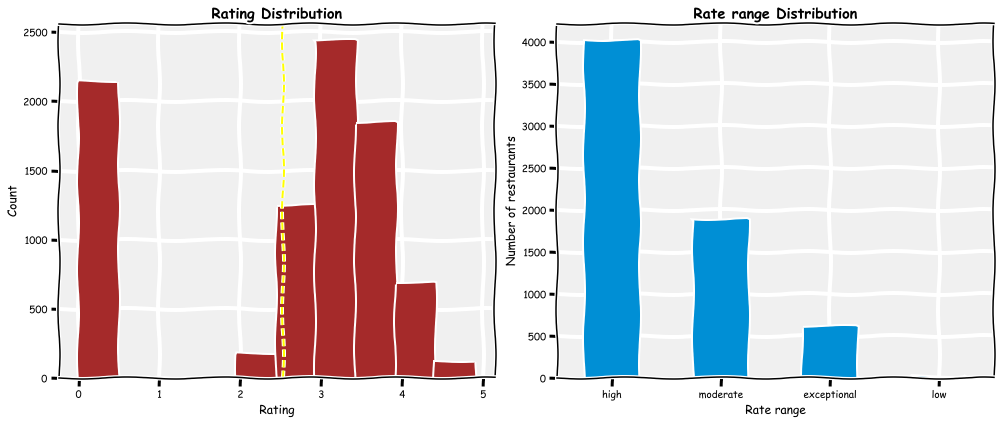

In [44]:
# histogram for restaurants average_rate
plt.figure(figsize = (14,6))
plt.subplot(1,2,1)
data.Aggregate_rating.hist(color='brown')
plt.axvline(x= data.Aggregate_rating.mean(),ls='--',color='yellow')
plt.title('Rating Distribution',weight='bold')
plt.xlabel('Rating')
plt.ylabel('Count')

plt.subplot(1,2,2)
data.rate_range.value_counts().plot(kind = 'bar',grid=True)
plt.title('Rate range Distribution',weight='bold')
plt.xlabel('Rate range')
plt.ylabel('Number of restaurants')
plt.xticks(rotation=0)
plt.tight_layout();


Mean rating is 2.5 and highest number of restaurants are in the range of rating 3.2 to 3.6


High rate range distribution restaurants are maximum in number 

### Distribution of the Price_range and cost Range

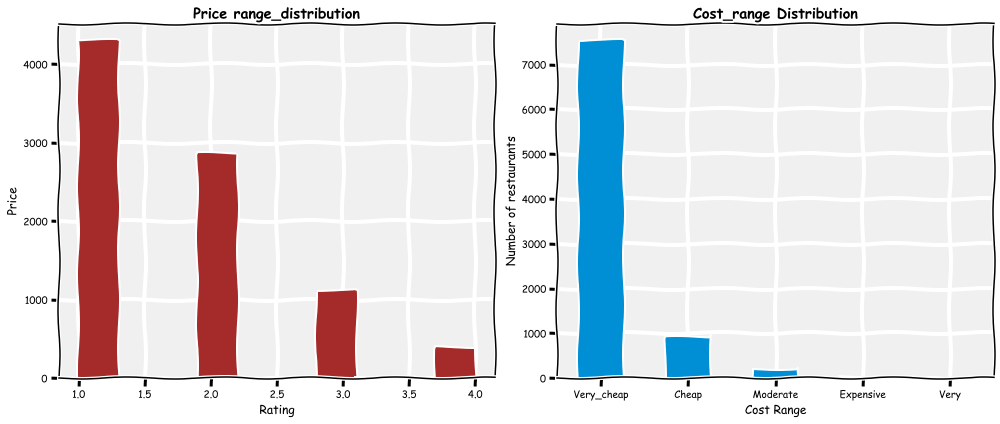

In [45]:
plt.figure(figsize = (14,6))
plt.subplot(1,2,1)
data.Price_range.hist(color='brown')
plt.title('Price range_distribution',weight='bold')
plt.xlabel('Rating')
plt.ylabel('Price')

plt.subplot(1,2,2)
data.cost_range.value_counts().plot(kind = 'bar',grid=True)
plt.title('Cost_range Distribution',weight='bold')
plt.xlabel('Cost Range')
plt.ylabel('Number of restaurants')
plt.xticks(rotation=0)
plt.tight_layout();


The Price Range distribution for the for different price ranges is seen higest for 1 rated restaurants.

Restaurants for the very cheap criteria is maximum in number crossing 7000

###  Number of votes vs Aggregate Rating

<Figure size 1080x864 with 0 Axes>

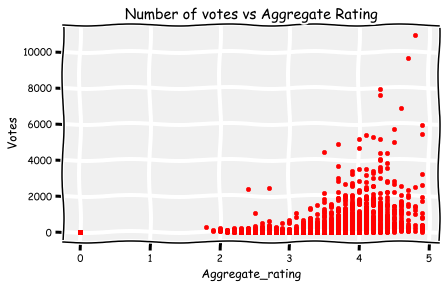

In [46]:
# votes vs rate
plt.figure(figsize = (15,12))
data.plot(kind='scatter',x='Aggregate_rating',y='Votes',marker='o',color='r',grid=True)
plt.title('Number of votes vs Aggregate Rating');
plt.show()

**Aggregate_rating** between **3.5** and **4.5** has highest number of **votes**.

#### Probablity distribution of average_cost

D:\Apps\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


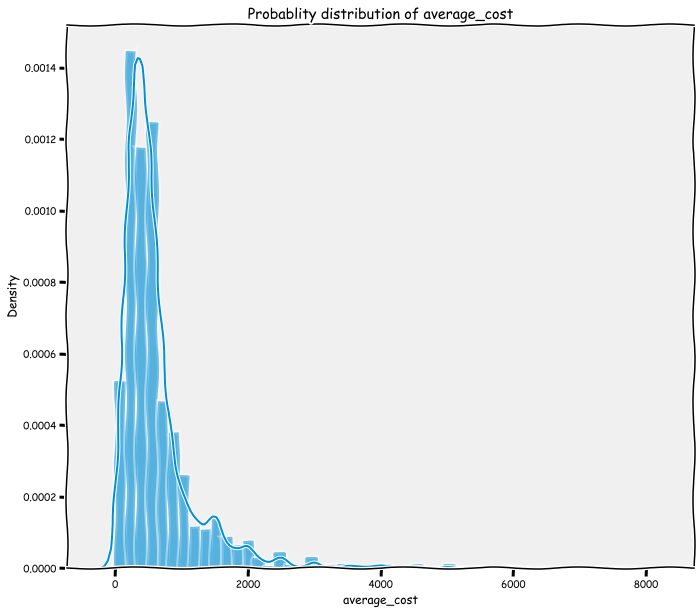

In [47]:
plt.figure(figsize=(10,10))
sns.distplot(data['average_cost'])
# y-axis -> probablity density function (PDF)
plt.title('Probablity distribution of average_cost')
plt.show()

Majority of the restaurants are in the 0-2000 range of the average cost

#### Probability of the Price_range

D:\Apps\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


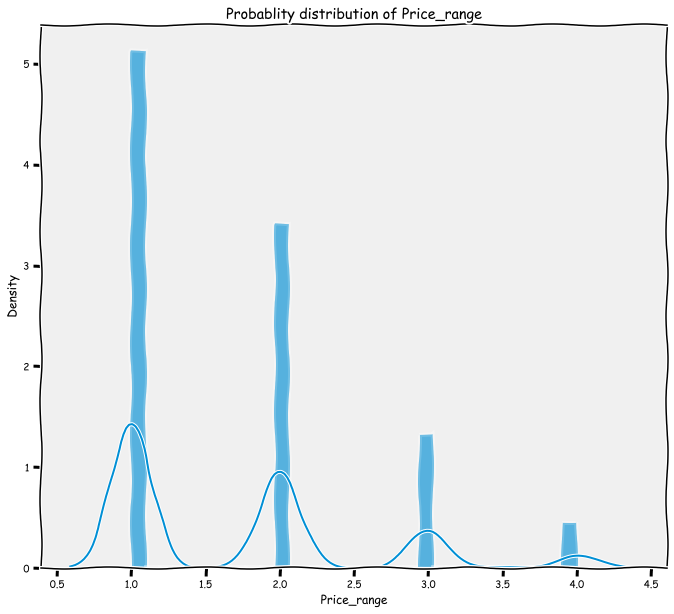

In [48]:
plt.figure(figsize=(10,10))
sns.distplot(data['Price_range'])
# y-axis -> probablity density function (PDF)
plt.title('Probablity distribution of Price_range')
plt.show()

#### Probability of the Aggregate Rating

D:\Apps\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


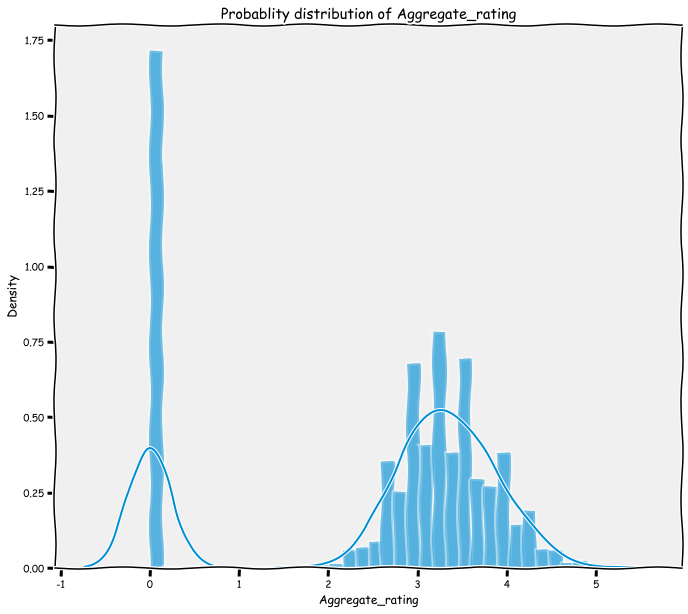

In [49]:
plt.figure(figsize=(10,10))
sns.distplot(data['Aggregate_rating'])
# y-axis -> probablity density function (PDF)
plt.title('Probablity distribution of Aggregate_rating')
plt.show()

#### Probability of the Votes

D:\Apps\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


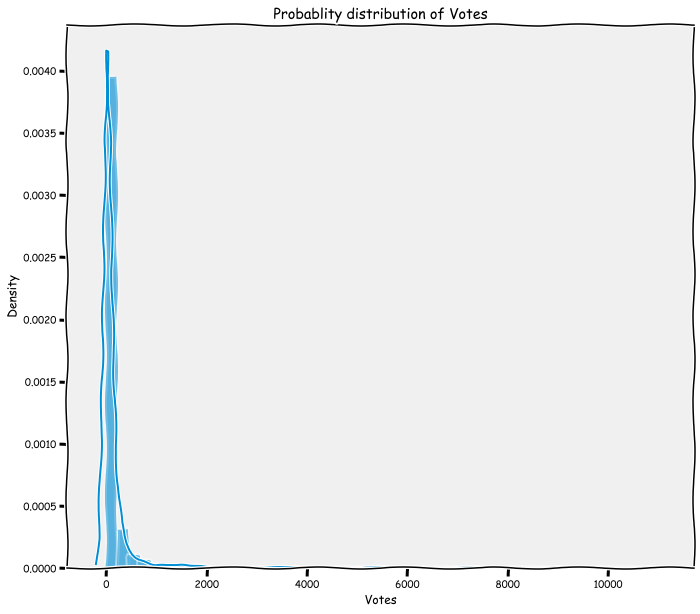

In [50]:
plt.figure(figsize=(10,10))
sns.distplot(data['Votes'])
# y-axis -> probablity density function (PDF)
plt.title('Probablity distribution of Votes')
plt.show()

### Scatter plot for aggregate rating over average cost

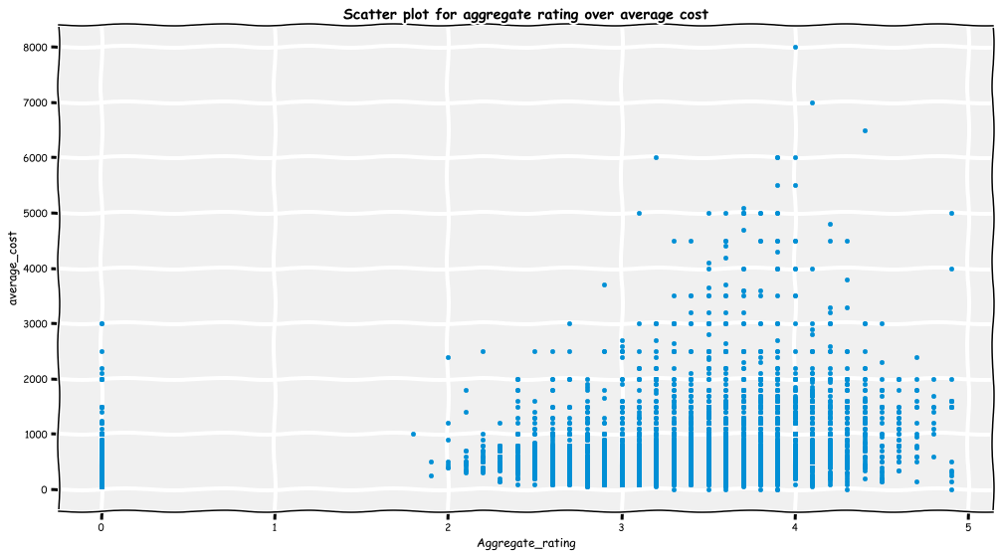

In [51]:
# votes vs rate
data.plot(figsize=(15,9), kind='scatter',x='Aggregate_rating',y='average_cost',marker='o',grid=True)
plt.title('Scatter plot for aggregate rating over average cost',weight='bold');

The above scatter plot shows that high cost restaurants have rating greater than 3.5

#####   Top 10 Count of restaurants with respect to cities  present in different localities 

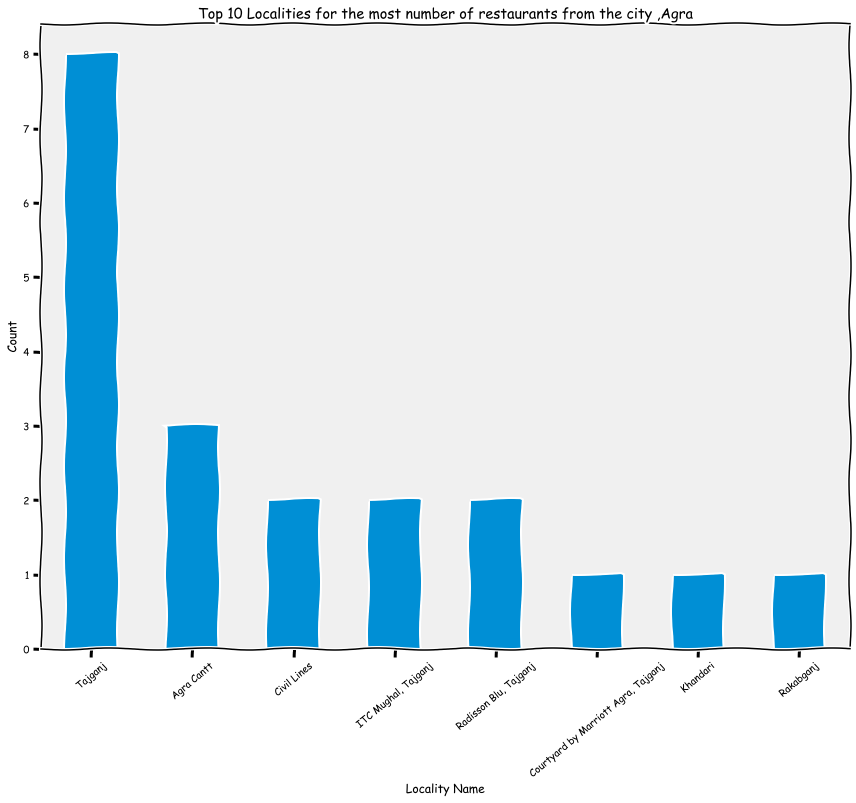

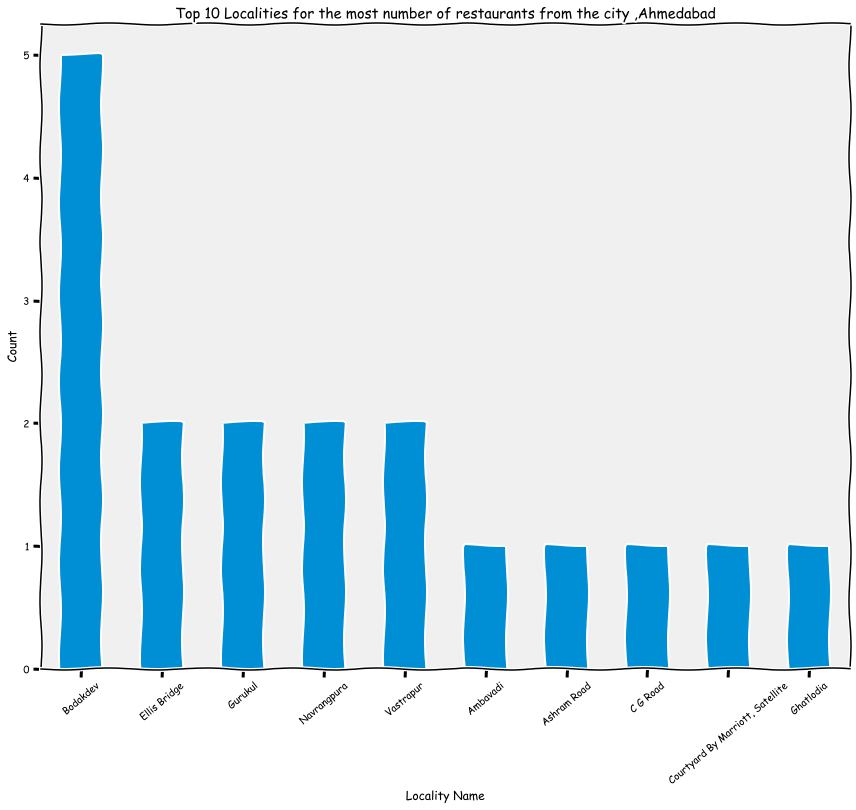

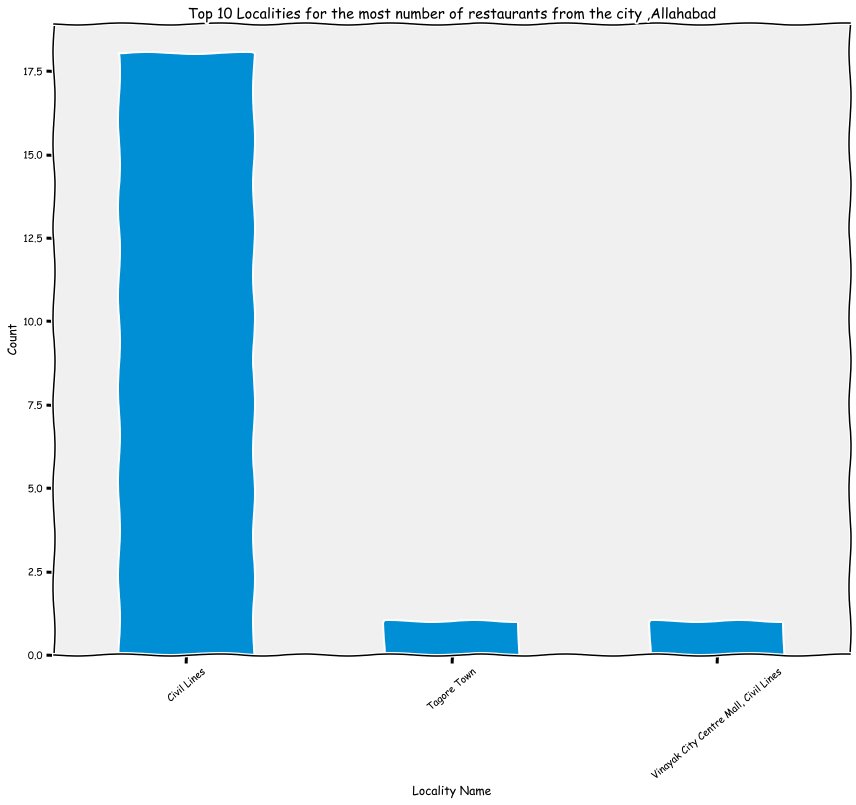

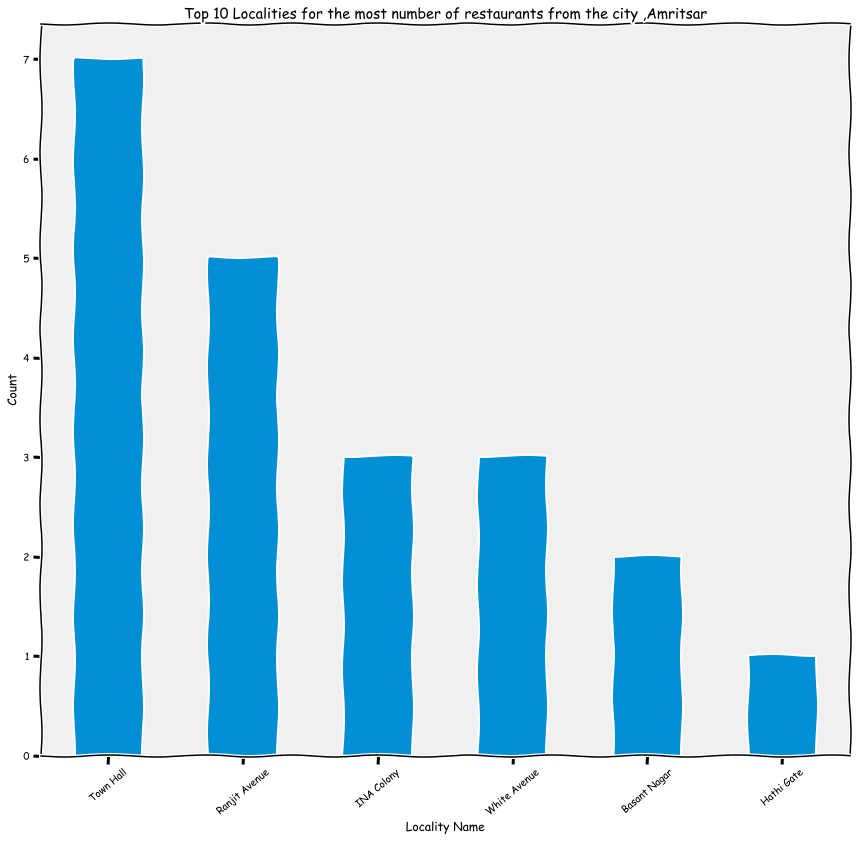

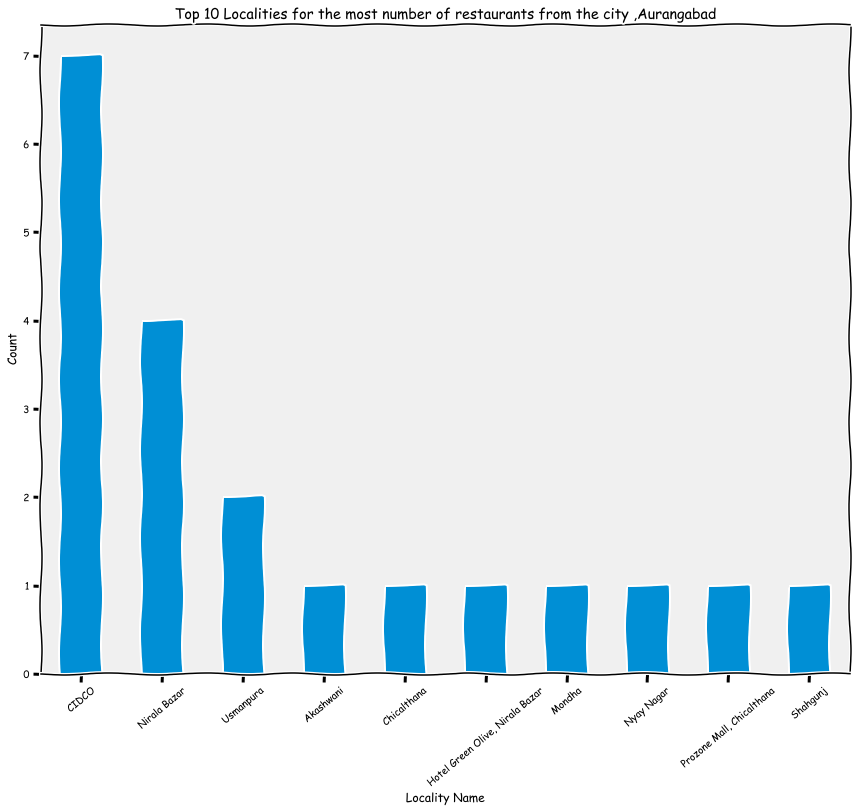

...

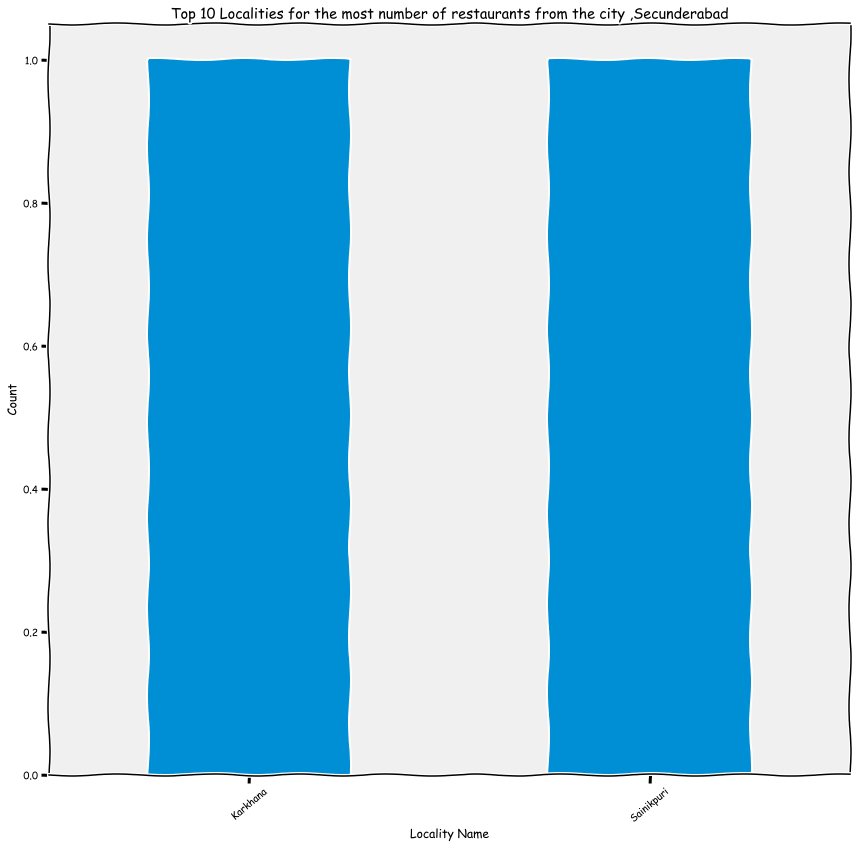

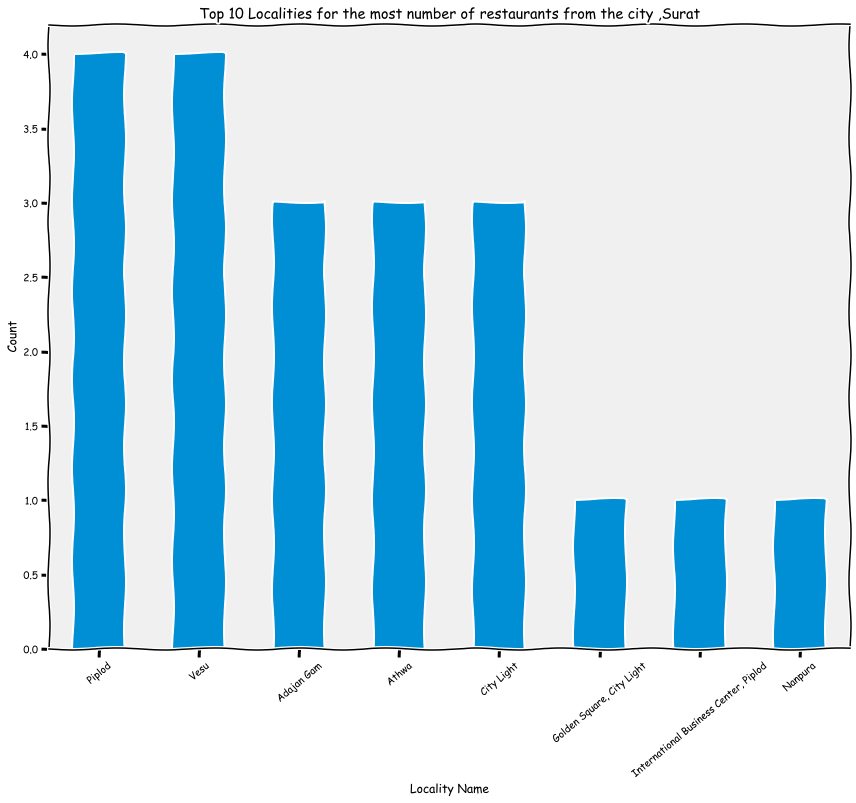

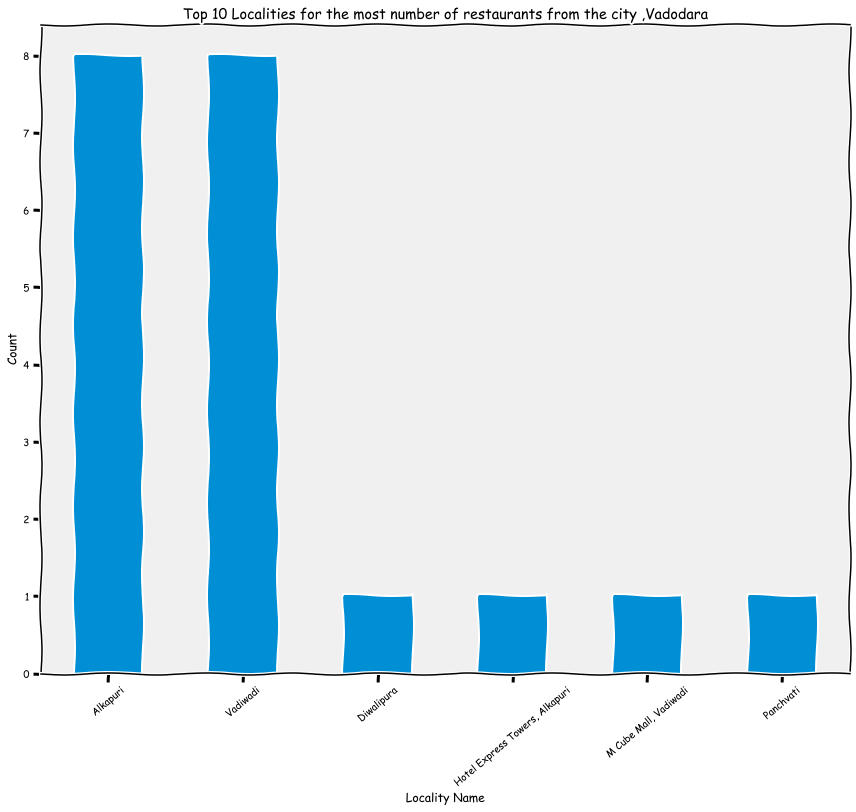

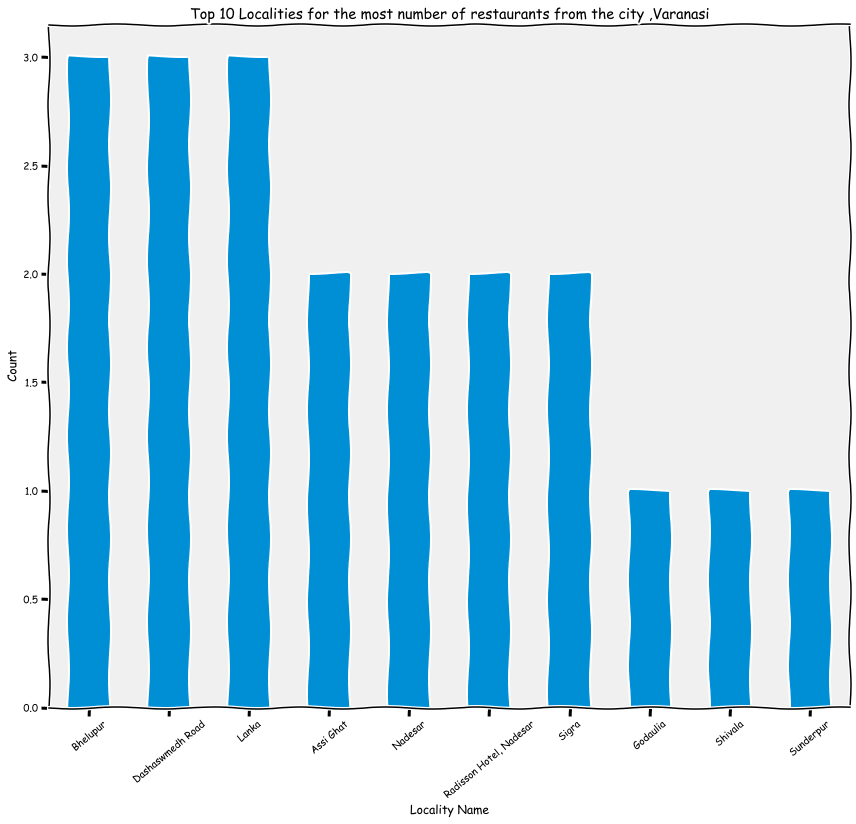

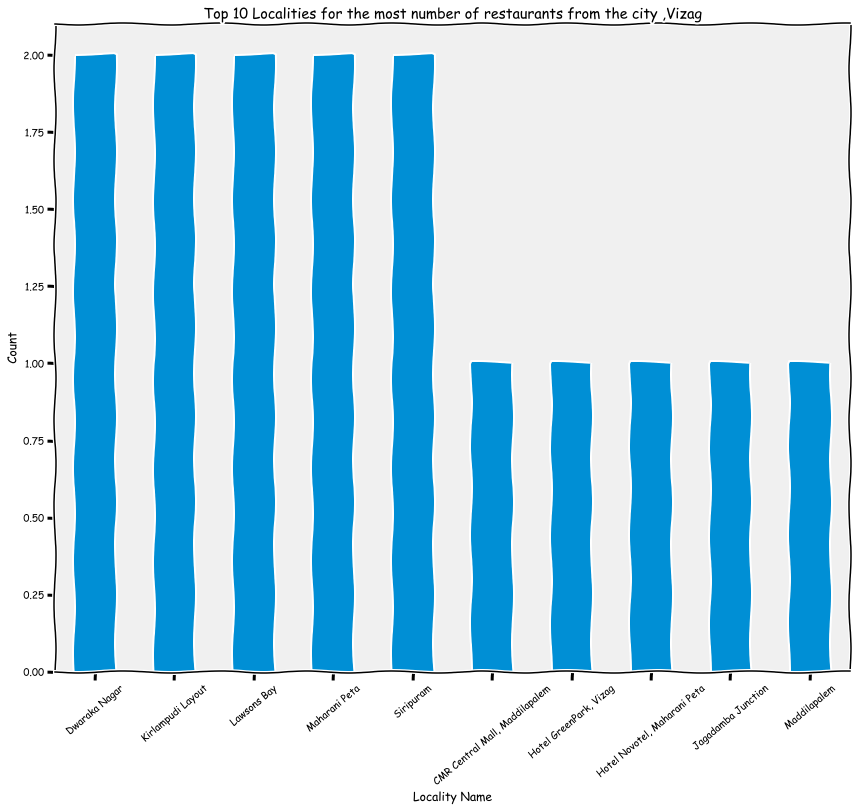

In [52]:
for i in data['City'].unique():
    plt.figure(figsize = (12,12))
    data[data["City"]==i]['Locality'].value_counts()[0:10].plot(kind = 'bar')
    plt.title(f"Top 10 Localities for the most number of restaurants from the city ,{i}")
    plt.xlabel("Locality Name")
    plt.ylabel("Count");
    plt.tight_layout();
    plt.xticks(rotation = 40);
    plt.show()

The above plots will show count of restaurants present in a particular Locality from a specified city

We can also find the best place in a particular city for finding the best restaurants

### Cuisine trend Locality wise

In [53]:
loc_cuisine = data.groupby('Locality')['Cuisines'].value_counts().sort_values(ascending=False)
ind = loc_cuisine.index.levels[0]
top_cuisine , rest_count =[],[]
for i in ind:
    top_cuisine.append(loc_cuisine[i].index[0])
    rest_count.append(loc_cuisine[i][0])

In [54]:
# location's top cuisine
pd.DataFrame({'Locality':ind,'top_cuisine':top_cuisine,'rest_count':rest_count})

,Locality,top_cuisine,rest_count
0,"ILD Trade Centre Mall, Sohna Road","Cafe, Beverages",1
1,"12th Square Building, Banjara Hills","Mughlai, North Indian, Chinese",1
2,"A Hotel, Gurdev Nagar","North Indian, Chinese, Fast Food",1
3,"ARSS Mall, Paschim Vihar","North Indian, South Indian, Chinese, Mithai, F...",1
4,Aaya Nagar,Cuisine Varies,1
...,...,...,...
779,Yusuf Sarai,Fast Food,4
780,"Z Square Mall, Mall Road","North Indian, Mughlai, Lebanese, Arabian, Medi...",1
781,Zakir Nagar,Chinese,2
782,Zoo Tiniali,"Continental, North Indian, Chinese, Arabian, Thai",1


From the above dataframe ,we can see that the Cuisine are been charterised by many neighbourhood.

###  How many  restaurants have online order service & book table service?

D:\Apps\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Online_Delivery', ylabel='count'>

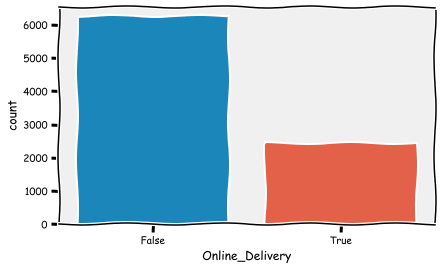

In [55]:
sns.countplot(data.Online_Delivery)

D:\Apps\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='table_booking', ylabel='count'>

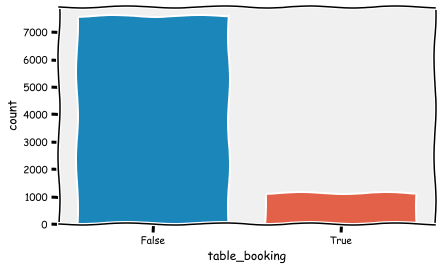

In [56]:
sns.countplot(data.table_booking)

From the above two graphs it is clear that most of the restaurants are based on the Online Order service are very few restaurants are based on the table_booking service

### How the online order service affects the restaurant rating?

<Figure size 720x720 with 0 Axes>

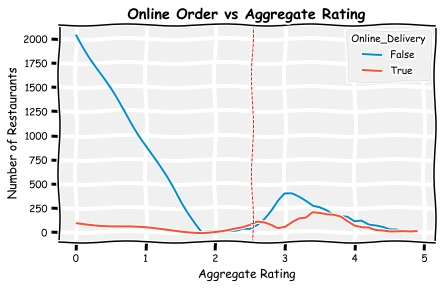

In [57]:
# collect the rate and online order columns
plt.figure(figsize = (10,10))
data_to_plot = pd.crosstab(data.Aggregate_rating, data['Online_Delivery'])
data_to_plot.plot(grid= True);
# set the average rate line
plt.axvline(data.Aggregate_rating.mean(),color="r",linewidth=0.9,ls="--")
plt.title('Online Order vs Aggregate Rating',weight='bold')
plt.ylabel('Number of Restaurants')
plt.xlabel('Aggregate Rating');

As we notice from the above chart that having the online order service has some effect on rating the restaurants , such that we can found at the same level of rate there is higher number of restaurants that has online order service especially above the average rate of 2.6.

### Best restaurant providing Online Order

In [58]:
avg_cost= data.average_cost.mean()
data.query('Online_Delivery == True & average_cost <= @avg_cost')[['Restaurant_Name','Aggregate_rating','average_cost','Locality','Votes']].\
sort_values(by=['Aggregate_rating','average_cost','Votes'],ascending=[False,True,False])[:20].drop_duplicates()

,Restaurant_Name,Aggregate_rating,average_cost,Locality,Votes
2389,Naturals Ice Cream,4.9,150,Connaught Place,2620
217,CakeBee,4.9,350,Saibaba Colony,200
757,Caterspoint,4.9,500,DLF Phase 3,223
6033,Naturals Ice Cream,4.7,150,Rajouri Garden,474
688,Twigly,4.6,500,DLF Phase 1,395
3730,Natural Ice Cream,4.5,150,"JMD Kohinoor Mall, Greater Kailash",665
3320,Natural Ice Cream,4.5,150,Hauz Khas,67
22,Huber & Holly,4.5,300,Bodakdev,217
179,Burgrill,4.5,500,Sector 8,249
1269,Twigly,4.5,500,Sector 31,76


Natural IceCreams in Connaught Place ranks the first place with highst rating and Votes with 4.9 and 2620

After that, CakeBee and Caterspoint with 4.9 rating of both and average cost of 350 and 500

### How the table_booking service affects the restaurant rating?

<Figure size 864x864 with 0 Axes>

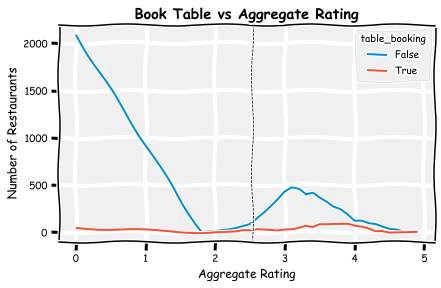

In [59]:
# collect the rate and table booking columns
plt.figure(figsize = (12,12))
data_to_plot = pd.crosstab(data['Aggregate_rating'], data['table_booking'])
data_to_plot.plot(grid=True,);
# set the average rate line
plt.axvline(x=data.Aggregate_rating.mean(),color="black",linewidth=0.75,ls="--")
plt.title('Book Table vs Aggregate Rating',weight='bold')
plt.ylabel('Number of Restaurants')
plt.xlabel('Aggregate Rating');

You can observe here that if your restaurant has no book table service you still have the opportunity to have a similar aggregate rating as other restaurants, that provide this service.
Most of the restaurant do not provide this service
- Note around **2.6** rating, we notice higher number of restaurants at this rate and provide book_table service

### Best restaurant providing table booking Order

In [60]:
avg_cost= data.average_cost.mean()
data.query('table_booking == True & average_cost <= @avg_cost')[['Restaurant_Name','Aggregate_rating','average_cost','Votes','Locality']].\
sort_values(by=['Aggregate_rating','average_cost','Votes'],ascending=[False,True,False])[:10].drop_duplicates()

,Restaurant_Name,Aggregate_rating,average_cost,Votes,Locality
3901,Chill'm Bar & Cafe,4.2,600,300,Kamla Nagar
5996,London Street Kitchen,4.2,600,163,Rajinder Nagar
3599,Wah Ji Wah,3.7,450,61,Janakpuri
1621,Live Wok,3.6,500,45,"Unitech Infospace, Sector 21, Gurgaon"
3880,Orange Tree Cafe,3.5,600,21,Kamla Nagar
403,Destination Live,3.3,500,12,Sector 37
3443,Jain Restaurant,0.0,500,0,IP Extension


Again, in **Chill'm Bar & Cafe** at Kamla Nagar, you can **book_table** with highest aggregate rating of **4.2**

**London Street Kitchen	** and **Wah Ji Wah** 2nd and 3rd place respectively.

## Rating Color popular in restaurants of India

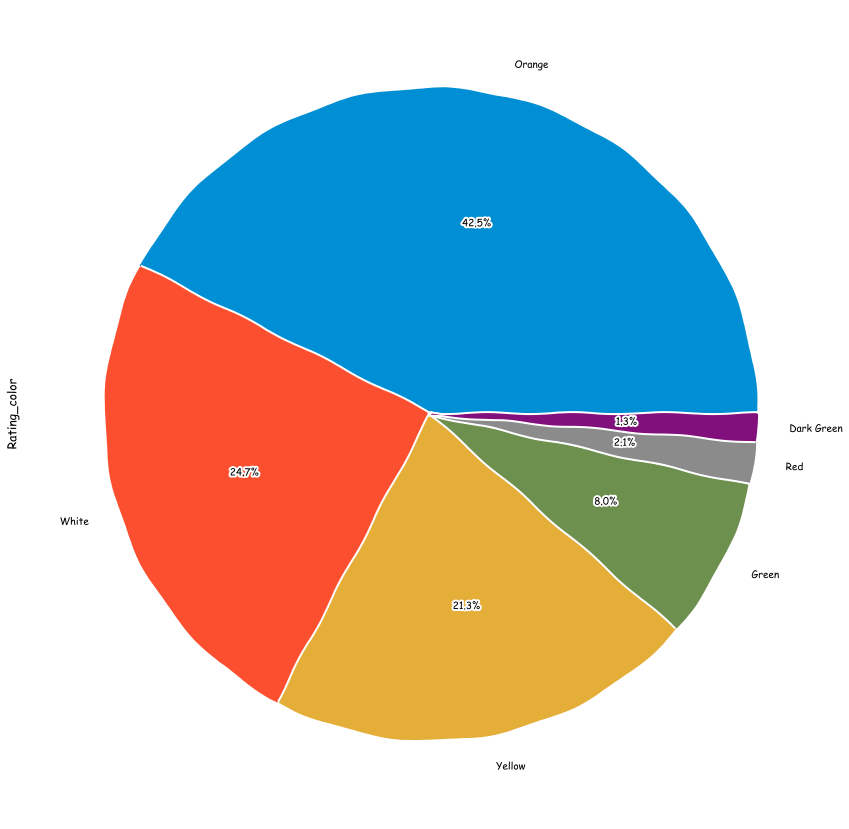

In [61]:
plt.figure(figsize = (15,15))
data.Rating_color.value_counts().plot(kind = "pie",autopct = "%.1f%%")
plt.show()

The above graph shows that maximum number of color used for rating was of the **Orange** which is more than **42%**
So most of the customers prefer to give average rating to the restaurant

The least color used for rating as **dark green** which is less than **2%**

So customers prefer to use orange for the average rating and dark green for the excellent rating

### City wise different color used for the rating purpose

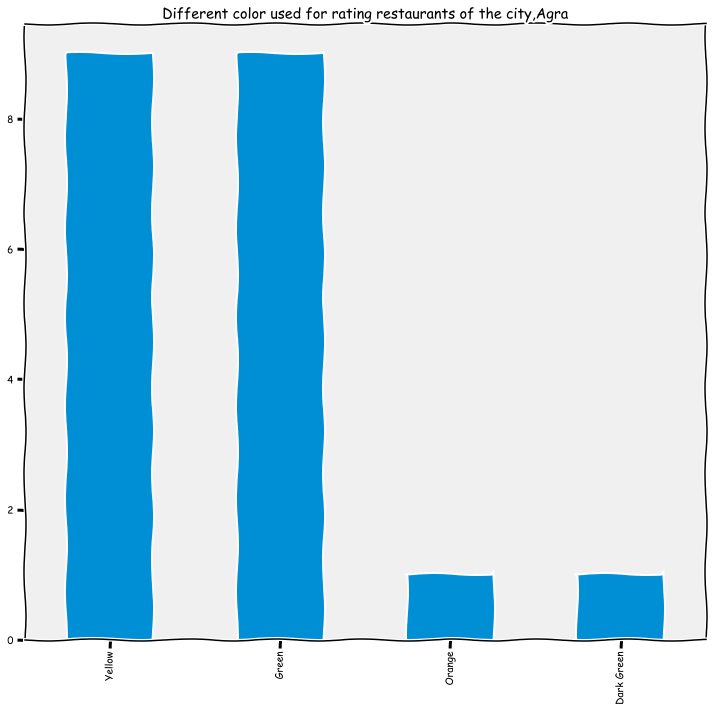

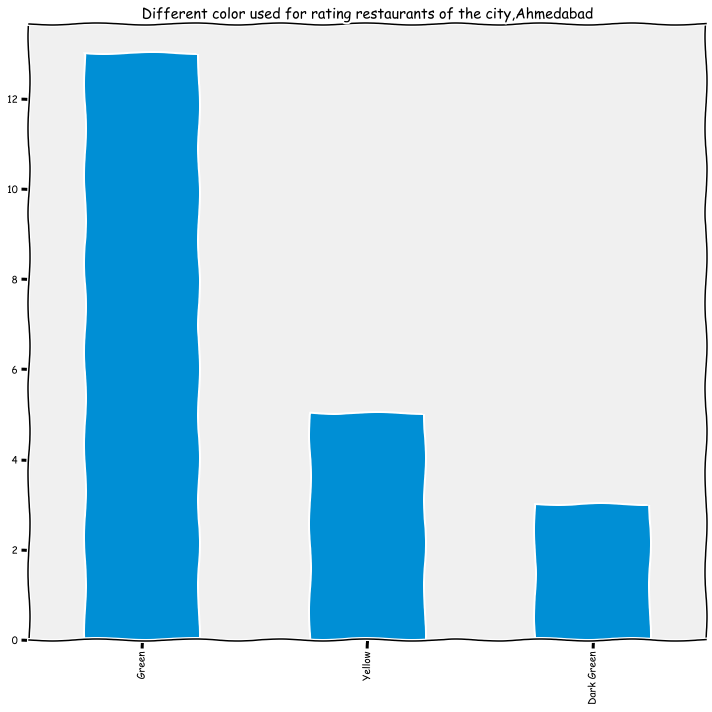

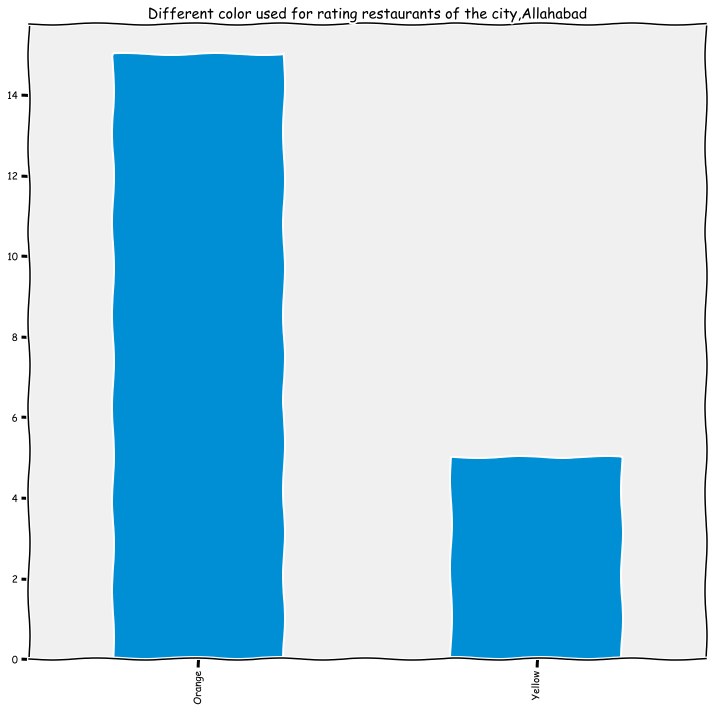

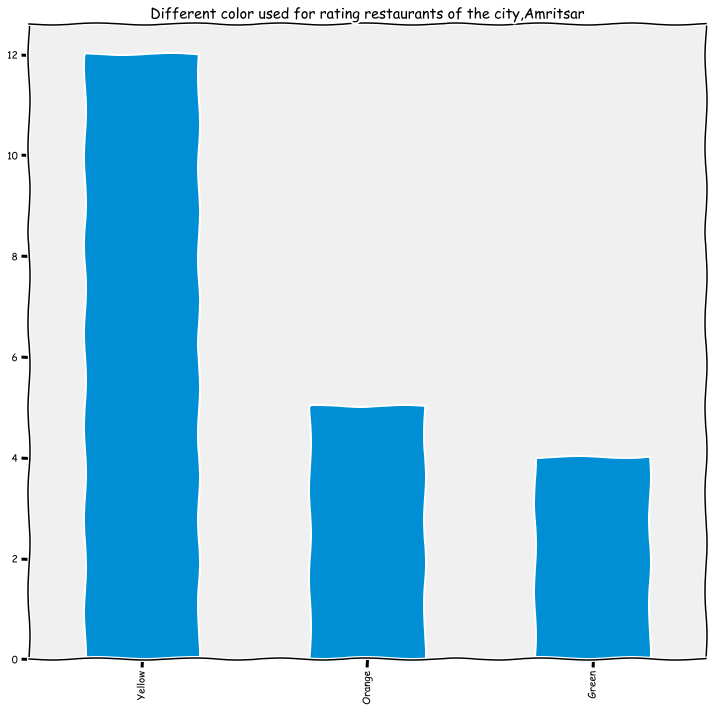

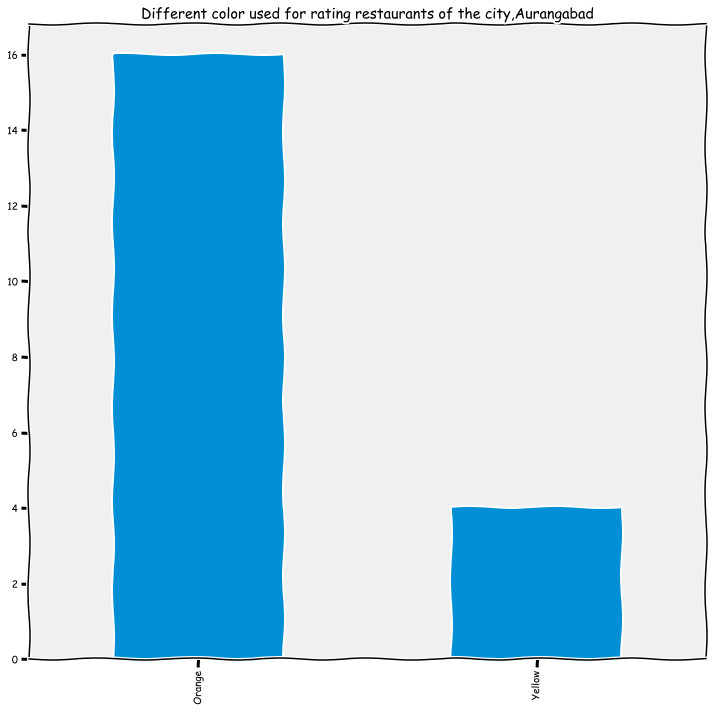

...

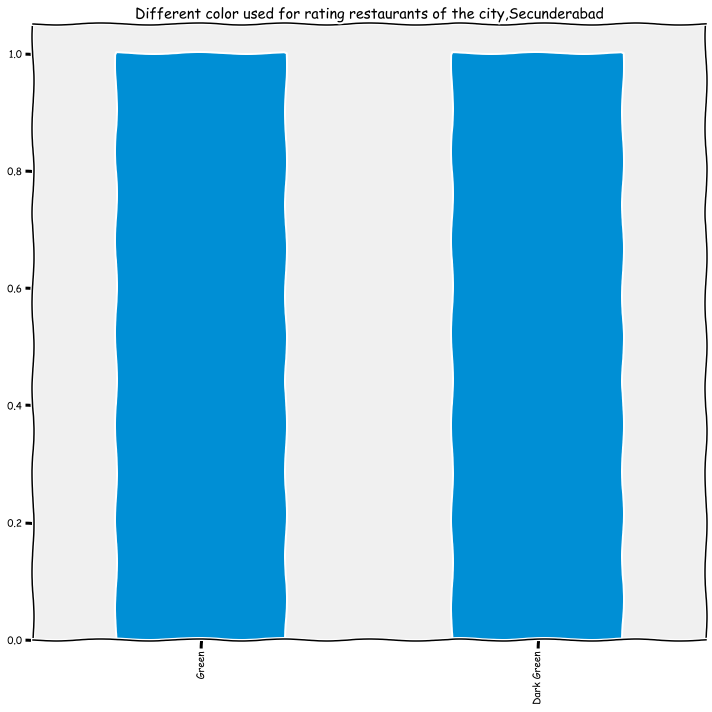

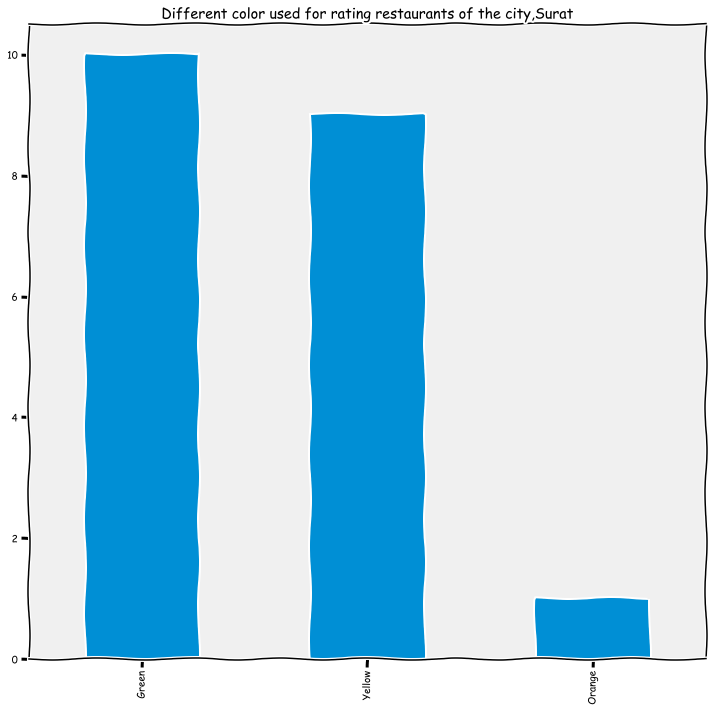

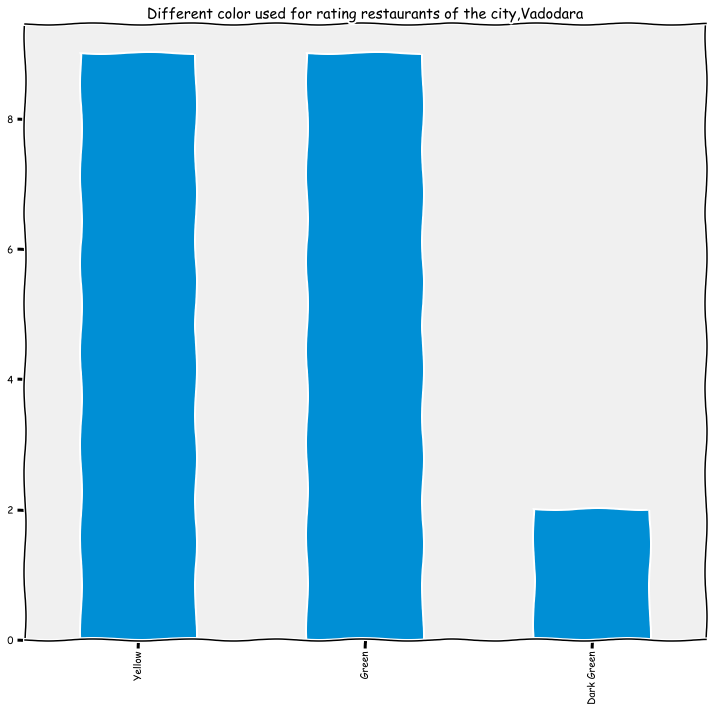

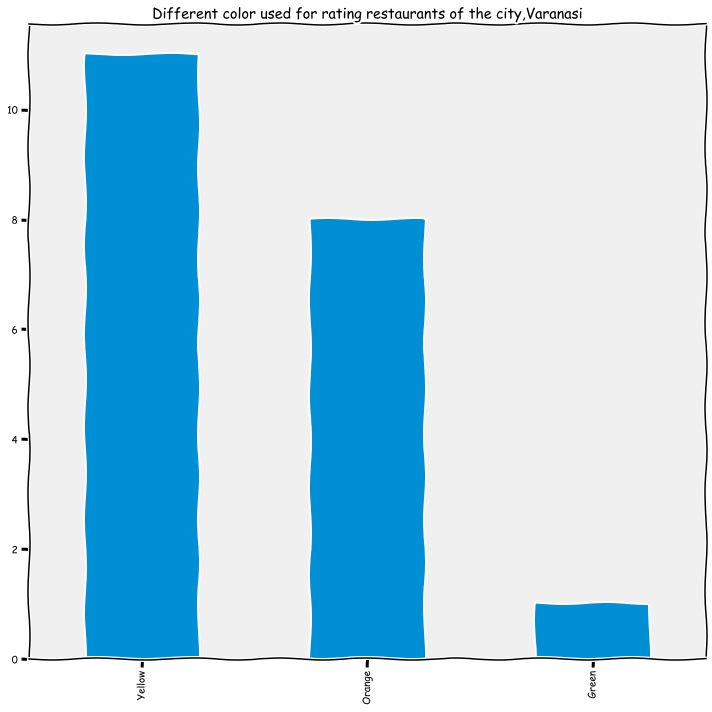

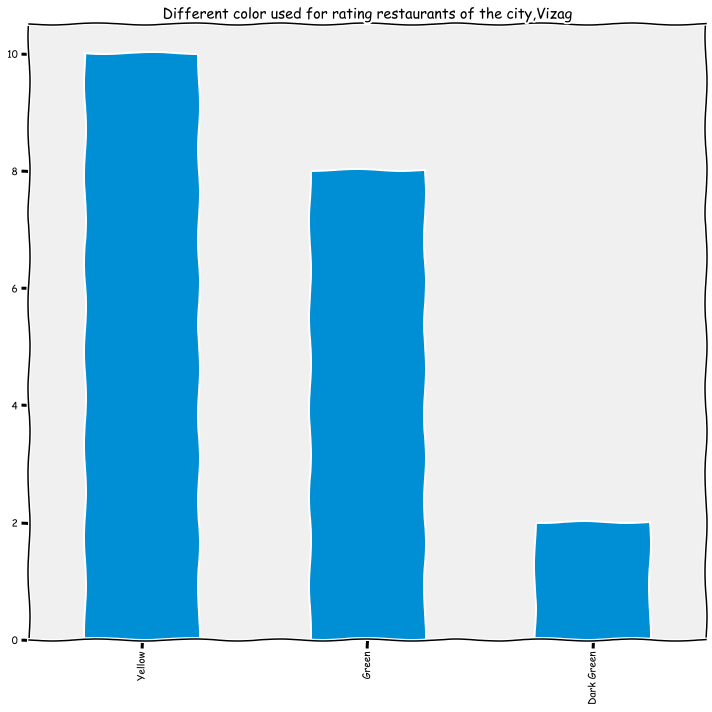

In [62]:
for i in data['City'].unique():
    plt.figure(figsize = (10,10))
    data[data["City"]==i].Rating_color.value_counts().plot(kind = "bar")
    plt.title(f"Different color used for rating restaurants of the city,{i}")
    plt.tight_layout();
    plt.show()

From the above pie plots we can see different colors used for rating different restaurants of the different cities

## Rating text popular in restaurants of India

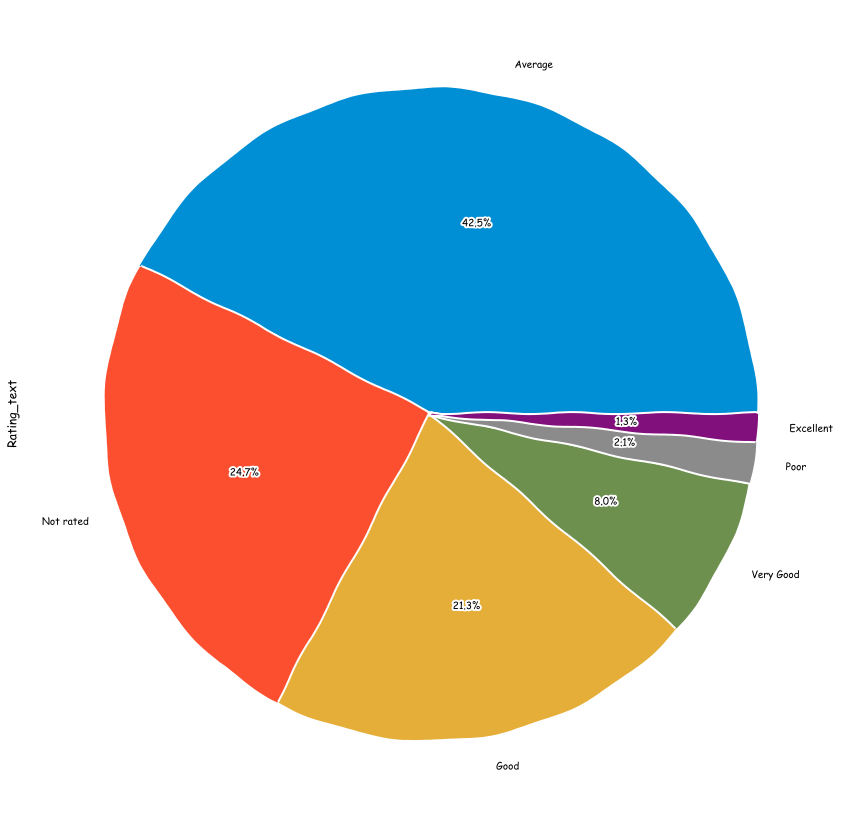

In [63]:
plt.figure(figsize = (15,15))
data.Rating_text.value_counts().plot(kind = "pie",autopct = "%.1f%%")
plt.show()

### Average rating given to restaurants according to the restaurants service

In [64]:
# comparing book_table average rate vs all rate
print(f'Average rate for all restaurants: {round(data.Aggregate_rating.mean(),2)}')
print(f"Average rate for book_table service restaurants: {round(data.query('table_booking == True')['Aggregate_rating'].mean(),2)}")
print(f"Average rate for online_order service restaurants: {round(data.query('Online_Delivery == True')['Aggregate_rating'].mean(),2)}")
print(f"Average rate for restaurants providing both table_booking and Online_Delivery service: {round(data.query('Online_Delivery == True & table_booking == True')['Aggregate_rating'].mean(),2)}")

Average rate for all restaurants: 2.52
Average rate for book_table service restaurants: 3.4
Average rate for online_order service restaurants: 3.24
Average rate for restaurants providing both table_booking and Online_Delivery service: 3.58


### Characteristics of restuarants with Online_Delivery service

In [65]:
# set averages of votes, rates, price_range and cost in case online_order service
data.query('Online_Delivery == True')[['Votes','Aggregate_rating','average_cost','Price_range']].mean()

Votes               209.085431
Aggregate_rating      3.238836
average_cost        684.874123
Price_range           1.910442
dtype: float64

### Characteristics of restaurants with table_booking service

In [66]:
# set averages of votes, rates,price_range and cost in case book_table service
data.query('table_booking == True')[['Votes','Aggregate_rating','average_cost','Price_range']].mean()

Votes                346.919892
Aggregate_rating       3.400000
average_cost        1569.801980
Price_range            3.012601
dtype: float64

The above two values of charactieristics shows that the average cost in case of online delivery is quite cheaper in compared to table booking service

### Finding the relation between neighborhood and cost

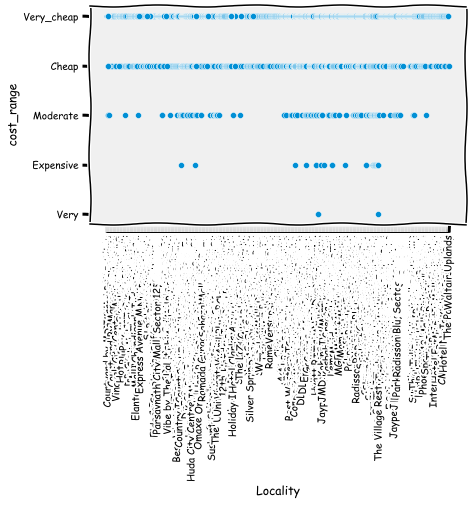

In [67]:
# location versus cost_range
sns.scatterplot(x = data.Locality,y = data.cost_range)
plt.xticks(rotation = 90)
plt.show()

In [68]:
# THe above graph shows that the maximum locality is comprised of the very cheap restuarants

### What is the relation between votes and neighbouhood?

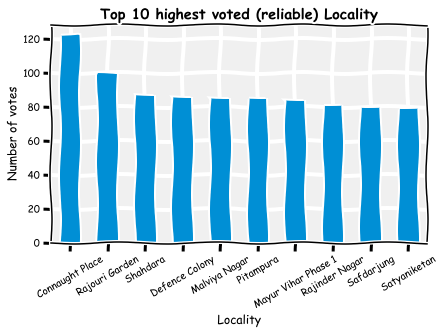

In [69]:
data.groupby('Locality')['Votes'].count().sort_values(ascending=False)[:10].plot(kind = 'bar', grid=True)
plt.title('Top 10 highest voted (reliable) Locality',weight='bold')
plt.ylabel('Number of votes')
plt.xticks(rotation=30)
plt.show()

**Cannaught Place** has the highest number of votes, followed by **Rajuari Garden** and **Shahdara**

In [70]:
### Different cities vs votes

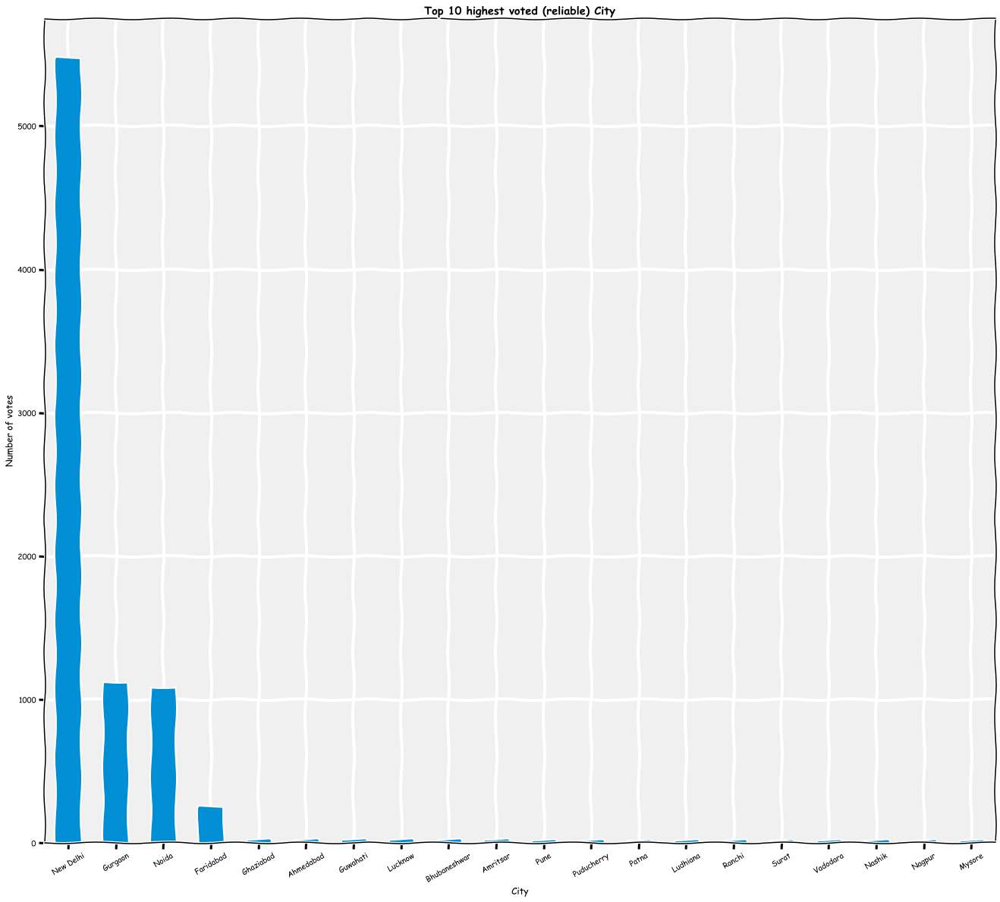

In [71]:
plt.figure(figsize = (20,20))
data.groupby('City')['Votes'].count().sort_values(ascending=False)[:20].plot(kind = 'bar', grid=True)
plt.title('Top 10 highest voted (reliable) City',weight='bold')
plt.ylabel('Number of votes')
plt.xticks(rotation=30)
plt.show()

## Most voted,best rated   restaurants

In [72]:
data.query('Aggregate_rating > 4.5')[['Restaurant_Name','Votes','Aggregate_rating','average_cost','Locality']][:10].\
sort_values(by=['Aggregate_rating','Votes'],ascending=[False,False]).drop_duplicates()

,Restaurant_Name,Votes,Aggregate_rating,average_cost,Locality
124,Sagar Gaire Fast Food,427,4.9,250,Arera Colony
13,Sheroes Hangout,77,4.9,0,Tajganj
104,Toit,10934,4.8,2000,Indiranagar
111,Truffles,9667,4.7,800,Koramangala 5th Block
103,The Fatty Bao - Asian Gastro Bar,2369,4.7,2400,Indiranagar
110,ECHOES Koramangala,276,4.7,950,Koramangala 5th Block
115,AB's - Absolute Barbecues,6907,4.6,1400,Marathahalli
109,Onesta,781,4.6,600,JP Nagar
117,Onesta,627,4.6,600,New BEL Road
29,Cryo Lab,166,4.6,350,Ellis Bridge


This will be as:
- has the high aggregate_rating , > 4.5
- has the high number of votes as it will more reliable

# Best Restaurants

The best restaurants will 
- has the high rate , above average,
- has the high number of votes as it will more reliable
- has the low cost

In [73]:
# get the average votes & rate
avg_cost = data.average_cost.mean()
avg_rate = data.Aggregate_rating.mean()

# get the more reliable and relevant datapoints those with high votes , high rates and from lowest possible price
rel_data = data.query('Aggregate_rating >=@avg_rate & average_cost <= @avg_cost').sort_values(['Aggregate_rating', 'Votes', 'average_cost']\
                                                                           ,ascending=[False,False,True])
# the best list
rel_data[['Restaurant_Name','Aggregate_rating','Votes',"City",'Cuisines','average_cost','Locality']][:10].drop_duplicates()

,Restaurant_Name,Aggregate_rating,Votes,City,Cuisines,average_cost,Locality
2389,Naturals Ice Cream,4.9,2620,New Delhi,Ice Cream,150,Connaught Place
1794,Grandson of Tunday Kababi,4.9,1057,Lucknow,"Mughlai, Lucknowi",300,Aminabad
124,Sagar Gaire Fast Food,4.9,427,Bhopal,Fast Food,250,Arera Colony
757,Caterspoint,4.9,223,Gurgaon,"Mexican, American, Healthy Food",500,DLF Phase 3
217,CakeBee,4.9,200,Coimbatore,"Bakery, Desserts",350,Saibaba Colony
13,Sheroes Hangout,4.9,77,Agra,"Cafe, North Indian, Chinese",0,Tajganj
1684,ConÌ_u,4.8,1023,Hyderabad,"Bakery, Desserts",600,Jubilee Hills
6373,Echoes Satyaniketan,4.7,1563,New Delhi,"Cafe, Continental, Italian, Mexican, Chinese, ...",600,Satyaniketan
6033,Naturals Ice Cream,4.7,474,New Delhi,Ice Cream,150,Rajouri Garden
1691,Churrolto,4.7,344,Hyderabad,"Desserts, Cafe, Mexican",500,Madhapur


### Average cost at this overall best restaurants

In [74]:
# average_price from the most reliable data
rel_data['average_cost'].mean()

383.73323013415893

The average price is about 766 for 2 persons

### Heatmapping

In [75]:
def generateBaseMap(default_location=[27.1767, 78.0081], default_zoom_start=12):
    base_map = folium.Map(location=default_location, control_scale=True, zoom_start=default_zoom_start)
    return base_map

### Heatmap for density of restaurants 

In [76]:
lat={}
lon={}
for i in data.City.unique():
        Rest_locations=pd.DataFrame({'Locality':data[data.City==i].Locality.value_counts().index,'count':data[data.City==i].Locality.value_counts()})

        for index, row in data.iterrows():
            if row['Locality'] in Rest_locations['Locality'].to_list():
                lat[row['Locality']]= row['Latitude']
                lon[row['Locality']]= row['Longitude']

        Rest_locations['Latitude']= pd.DataFrame.from_dict(lat, orient='index')
        Rest_locations['Longitude']= pd.DataFrame.from_dict(lon, orient='index')

        Rest_locations= Rest_locations.reset_index()
        Rest_locations= Rest_locations.drop(columns='index')

        basemap=generateBaseMap()
        HeatMap(Rest_locations[['Latitude','Longitude','count']].values.tolist(),zoom=20,radius=16).add_to(basemap)

In [77]:
Rest_locations

,Locality,count,Latitude,Longitude
0,Dwaraka Nagar,2,17.726297,83.303414
1,Kirlampudi Layout,2,0.000000,0.000000
2,Lawsons Bay,2,17.734806,83.338097
3,Maharani Peta,2,0.000000,0.000000
4,Siripuram,2,17.719539,83.315281
5,"CMR Central Mall, Maddilapalem",1,17.734178,83.318511
6,"Hotel GreenPark, Vizag",1,17.715819,83.307073
7,"Hotel Novotel, Maharani Peta",1,17.710690,83.315935
8,Jagadamba Junction,1,17.712028,83.301614
9,Maddilapalem,1,17.740024,83.326859


In [78]:
basemap

I have adjusted the code for all the **cities** present in the given dataset.

You can watch the density of restaurant for all the cities just by changing the **latitute** and **longitude**

## Predictions 


In [79]:
df1= data.copy()

In [80]:
df1["full_cuisines_list"] = pd.Series(count_element_in_list("Cuisines"))

### Label encoding ***Online_Delivery*** and ***table_booking***  for Regression analysis

In [81]:
pd.set_option('display.max_columns', None)

In [82]:
le = preprocessing.LabelEncoder()
df1['online_order_'] = le.fit_transform(df1.Online_Delivery.values)
df1['book_table_'] = le.fit_transform(df1.table_booking.values)
df1['meal_type_'] = le.fit_transform(df1.full_cuisines_list.values)

In [83]:
df1

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,average_cost,Currency,table_booking,Online_Delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes,cost_range,rate_range,rest_type_list,new_cuisines_list,full_cuisines_list,online_order_,book_table_,meal_type_
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),False,False,False,False,3,3.9,Yellow,Good,140,Very_cheap,high,[Jahanpanah],"[ North Indian, Mughlai]",North Indian,0,0,62
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),False,False,False,False,2,3.5,Yellow,Good,71,Very_cheap,high,[Rangrezz Restaurant],"[ North Indian, Mughlai]",Mughlai,0,0,58
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,94,Very_cheap,high,[Time2Eat - Mama Chicken],[ North Indian],North Indian,0,0,62
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),False,False,False,False,2,4.0,Green,Very Good,87,Very_cheap,high,[Chokho Jeeman Marwari Jain Bhojanalya],[ Rajasthani],Mughlai,0,0,58
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),False,False,False,False,3,4.2,Green,Very Good,177,Very_cheap,exceptional,[Pinch Of Spice],"[ North Indian, Chinese, Mughlai]",North Indian,0,0,62
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8647,2800100,D Cabana,1,Vizag,"Beach Road, Near Bus Stop, Sagar Nagar, Visakh...",Sagar Nagar,"Sagar Nagar, Vizag",83.361377,17.764287,"Continental, Seafood, Chinese, North Indian, B...",600,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,193,Very_cheap,high,[D Cabana],"[ Continental, Seafood, Chinese, North Indi...",Italian,0,0,40
8648,2800418,Kaloreez,1,Vizag,"Plot 95, Opposite St. Lukes Nursing School, Da...",Siripuram,"Siripuram, Vizag",0.000000,0.000000,"Cafe, North Indian, Chinese",400,Indian Rupees(Rs.),False,False,False,False,2,3.7,Yellow,Good,85,Very_cheap,high,[Kaloreez],"[ Cafe, North Indian, Chinese]",Continental,0,0,22
8649,2800881,Plot 17,1,Vizag,"Plot 17, Gangapur Layout, Siripuram, Vizag",Siripuram,"Siripuram, Vizag",83.315281,17.719539,"Burger, Pizza, Biryani",600,Indian Rupees(Rs.),False,False,False,False,2,4.3,Green,Very Good,172,Very_cheap,exceptional,[Plot 17],"[ Burger, Pizza, Biryani]",European,0,0,26
8650,2800042,Vista - The Park,1,Vizag,"The Park, Beach Road, Pedda Waltair, Lawsons B...","The Park, Lawsons Bay","The Park, Lawsons Bay, Vizag",83.336840,17.721182,"American, North Indian, Thai, Continental",1500,Indian Rupees(Rs.),False,False,False,False,4,3.8,Yellow,Good,74,Cheap,high,[Vista - The Park],"[ American, North Indian, Thai, Continental]",Cafe,0,0,18


### Multi Label Binarizing (1- hot encoding) ***full_cuisines_list*** feature for Regression analysis

In [84]:
mlb = MultiLabelBinarizer()

res = pd.DataFrame(mlb.fit_transform(df1['full_cuisines_list']),
                   columns=mlb.classes_,
                   index=df1.index)

In [85]:
res

,,-,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,R,S,T,V,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p,r,s,t,u,v,w,x,y,z
0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8647,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0
8648,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0
8649,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1,0,0,0,0,0
8650,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [86]:
# Concatenating df1 and Multi Label Binarized cuisine_list column dataframe

df1= pd.concat([df1, res], axis=1)
df1[:5]

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Locality_Verbose,Longitude,Latitude,Cuisines,average_cost,Currency,table_booking,Online_Delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes,cost_range,rate_range,rest_type_list,new_cuisines_list,full_cuisines_list,online_order_,book_table_,meal_type_,,-,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,R,S,T,V,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p,r,s,t,u,v,w,x,y,z
0,3400025,Jahanpanah,1,Agra,"E 23, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",78.011544,27.161661,"North Indian, Mughlai",850,Indian Rupees(Rs.),False,False,False,False,3,3.9,Yellow,Good,140,Very_cheap,high,[Jahanpanah],"[ North Indian, Mughlai]",North Indian,0,0,62,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
1,3400341,Rangrezz Restaurant,1,Agra,"E-20, Shopping Arcade, Sadar Bazaar, Agra Cant...",Agra Cantt,"Agra Cantt, Agra",0.000000,0.000000,"North Indian, Mughlai",700,Indian Rupees(Rs.),False,False,False,False,2,3.5,Yellow,Good,71,Very_cheap,high,[Rangrezz Restaurant],"[ North Indian, Mughlai]",Mughlai,0,0,58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,3400005,Time2Eat - Mama Chicken,1,Agra,"Main Market, Sadar Bazaar, Agra Cantt, Agra",Agra Cantt,"Agra Cantt, Agra",78.011608,27.160832,North Indian,500,Indian Rupees(Rs.),False,False,False,False,2,3.6,Yellow,Good,94,Very_cheap,high,[Time2Eat - Mama Chicken],[ North Indian],North Indian,0,0,62,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
3,3400021,Chokho Jeeman Marwari Jain Bhojanalya,1,Agra,"1/48, Delhi Gate, Station Road, Raja Mandi, Ci...",Civil Lines,"Civil Lines, Agra",77.998092,27.195928,Rajasthani,400,Indian Rupees(Rs.),False,False,False,False,2,4.0,Green,Very Good,87,Very_cheap,high,[Chokho Jeeman Marwari Jain Bhojanalya],[ Rajasthani],Mughlai,0,0,58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,3400017,Pinch Of Spice,1,Agra,"23/453, Opposite Sanjay Cinema, Wazipura Road,...",Civil Lines,"Civil Lines, Agra",78.007553,27.201725,"North Indian, Chinese, Mughlai",1000,Indian Rupees(Rs.),False,False,False,False,3,4.2,Green,Very Good,177,Very_cheap,exceptional,[Pinch Of Spice],"[ North Indian, Chinese, Mughlai]",North Indian,0,0,62,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0


## Aggregate_rating prediction by Regression Analysis

### Train Test split

In [87]:
x = df1.loc[:,['average_cost','Price_range','Votes',
              'online_order_', 'book_table_', 'meal_type_', ' ',
       '-', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M',
       'N', 'O', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'f', 'g',
       'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'r', 's', 't', 'u', 'v',
       'w', 'x', 'y', 'z']]

In [88]:
x

,average_cost,Price_range,Votes,online_order_,book_table_,meal_type_,,-,A,B,C,D,E,F,G,H,I,J,K,L,M,N,O,P,R,S,T,V,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,p,r,s,t,u,v,w,x,y,z
0,850,3,140,0,0,62,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
1,700,2,71,0,0,58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
2,500,2,94,0,0,62,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
3,400,2,87,0,0,58,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
4,1000,3,177,0,0,62,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,0,0,1,1,0,1,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8647,600,2,193,0,0,40,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0
8648,400,2,85,0,0,22,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0
8649,600,2,172,0,0,26,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,0,0,1,0,0,0,0,0
8650,1500,4,74,0,0,18,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [89]:
y = df1['Aggregate_rating']

In [90]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.3,random_state=42)

### Linear Regression

In [91]:
#Prepare a Linear REgression Model
reg=LinearRegression()
reg.fit(x_train,y_train)
y_pred=reg.predict(x_test)
print("R2_score:", r2_score(y_test,y_pred))

R2_score: 0.23831133212202493


**Linear Regression** gave **r2_score** of just **0.238** 

### Random Forest Regression

In [92]:
#Preparing Random Forest REgression
from sklearn.ensemble import RandomForestRegressor
RForest=RandomForestRegressor(n_estimators=600,random_state=32,min_samples_leaf=.0001)
RForest.fit(x_train,y_train)
y_predict=RForest.predict(x_test)
print("R2_score:", r2_score(y_test,y_predict))

R2_score: 0.9452279860529161


**Random Forest Regression** gave **r2_score** of  **-0.21** 

### Decision Tree Regression

In [93]:
#Prepairng a Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.1,random_state=105)
DTree=DecisionTreeRegressor(min_samples_leaf=.0001)
DTree.fit(x_train,y_train)
y_predict=DTree.predict(x_test)
print("R2_score:", r2_score(y_test,y_predict))

R2_score: 0.9115199829804461


**Decision Tree Regression** gave **r2_score** of  **0.9092466111341504** 

## Number of **votes** prediction by Regression Analysis

#### Train Test split

In [94]:
x = df1.loc[:,['average_cost','Price_range',
              'online_order_', 'book_table_', 'meal_type_', ' ',
       '-', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M',
       'N', 'O', 'P', 'R', 'S', 'T', 'V', 'a', 'b', 'c', 'd', 'e', 'f', 'g',
       'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'r', 's', 't', 'u', 'v',
       'w', 'x', 'y', 'z']]


y = df1['Votes']

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=35)

### Linear Regression

In [95]:
#Prepare a Linear Regression Model
reg=LinearRegression()
reg.fit(x_train,y_train)
y_pred=reg.predict(x_test)
print("R2_score:", r2_score(y_test,y_pred))

R2_score: 0.09899793420601177


### Decision Tree Regression

In [96]:
#Prepairng a Decision Tree Regression
from sklearn.tree import DecisionTreeRegressor
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.3,random_state=10)
DTree=DecisionTreeRegressor(min_samples_leaf=.0001)
DTree.fit(x_train,y_train)
y_predict=DTree.predict(x_test)
print("R2_score:",abs(r2_score(y_test,y_predict)))

R2_score: 0.35708751682246165


### Random Forest Regression

In [97]:
#Preparing Random Forest REgression
from sklearn.ensemble import RandomForestRegressor
RForest=RandomForestRegressor(n_estimators=500,random_state=329,min_samples_leaf=.0001)
RForest.fit(x_train,y_train)
y_predict=RForest.predict(x_test)
print("R2_score:", abs(r2_score(y_test,y_predict)))

R2_score: 0.021809231262641227


### Project Completed by -  **Swetanshu Pandey**